# Forecasting and Analyzing Renewable and Non-renewable Energy Generation and Demand Patterns using Machine Learning and Deep Learning Techniques

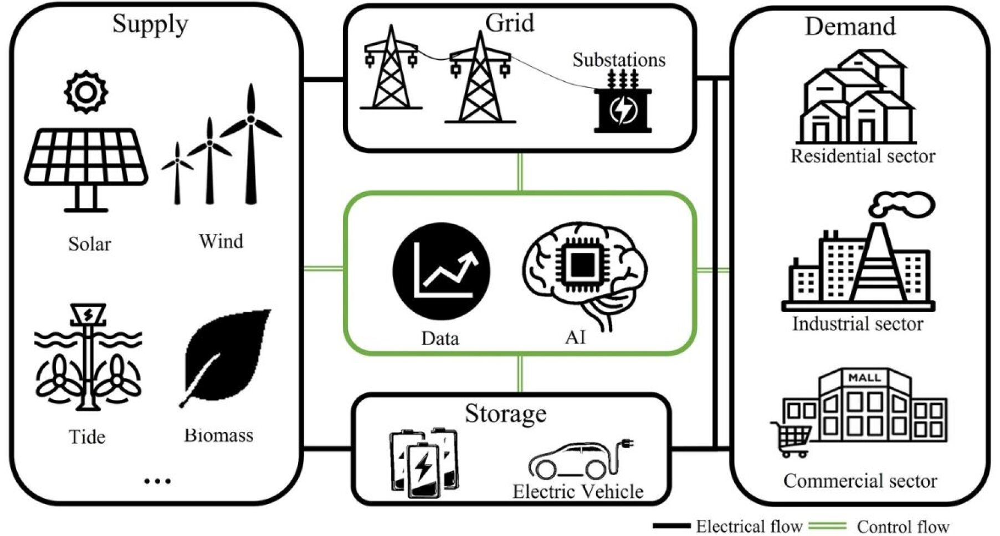

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('energy_dataset.csv')

In [4]:
df.head()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,196.0,0.0,6378.0,17,NaN,6436,26118,25385.0,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,195.0,0.0,5890.0,16,NaN,5856,24934,24382.0,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,196.0,0.0,5461.0,8,NaN,5454,23515,22734.0,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,191.0,0.0,5238.0,2,NaN,5151,22642,21286.0,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,189.0,0.0,4935.0,9,NaN,4861,21785,20264.0,38.41,56.04


In [5]:
df.tail()

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
35059,2018-12-31 19:00:00+01:00,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,...,277.0,0.0,3113.0,96,NaN,3253,30619,30653.0,68.85,77.02
35060,2018-12-31 20:00:00+01:00,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,...,280.0,0.0,3288.0,51,NaN,3353,29932,29735.0,68.40,76.16
35061,2018-12-31 21:00:00+01:00,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,...,286.0,0.0,3503.0,36,NaN,3404,27903,28071.0,66.88,74.30
35062,2018-12-31 22:00:00+01:00,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,...,287.0,0.0,3586.0,29,NaN,3273,25450,25801.0,63.93,69.89
35063,2018-12-31 23:00:00+01:00,290.0,0.0,0.0,6926.0,2166.0,163.0,0.0,0.0,0.0,...,287.0,0.0,3651.0,26,NaN,3117,24424,24455.0,64.27,69.88


In [6]:
df.shape

(35064, 29)

In [7]:
df.columns

Index(['time', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage aggregated',
       'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation solar', 'generation waste', 'generation wind offshore',
       'generation wind onshore', 'forecast solar day ahead',
       'forecast wind offshore eday ahead', 'forecast wind onshore day ahead',
       'total load forecast', 'total load actual', 'price day ahead',
       'price actual'],
      dtype='object')

The dataset is related to energy generation, consumption, load forecasting, and pricing data.

1. **time**: The timestamp of the recorded data, including the date and time. It also contains timezone information (`+01:00`), which suggests that the dataset might be from a European country.

2. **generation biomass**: The amount of energy generated from biomass (organic material used as fuel), measured in megawatts (MW) or similar energy units.

3. **generation fossil brown coal/lignite**: Energy generated from burning brown coal or lignite, a type of fossil fuel that's less efficient and more polluting compared to hard coal.

4. **generation fossil coal-derived gas**: The amount of energy generated from gases produced by gasifying or otherwise processing coal.

5. **generation fossil gas**: Energy produced from burning natural gas, a fossil fuel that emits lower CO2 compared to coal or oil but still contributes to greenhouse gases.

6. **generation fossil hard coal**: Energy generated from burning hard coal (anthracite), which is a denser and more efficient form of coal compared to lignite.

7. **generation fossil oil**: The amount of energy produced from burning crude oil or its derivatives.

8. **generation fossil oil shale**: Energy produced from oil shale, a sedimentary rock that contains organic material which can be converted to shale oil.

9. **generation fossil peat**: Energy generated from peat, an accumulation of decayed organic matter used as a fossil fuel. It's often considered an early stage of coal formation.

10. **generation geothermal**: The amount of energy generated using heat from the Earth’s core.

11. **generation hydro pumped storage aggregated**: Total energy generated through hydroelectric pumped storage, where water is pumped to a higher elevation during low demand and released to generate electricity during peak demand.

12. **generation hydro pumped storage consumption**: The amount of energy consumed in pumping water uphill in hydroelectric pumped storage systems. This is typically a negative value, as it represents energy used rather than produced.

13. **generation hydro run-of-river and poundage**: Energy generated by hydroelectric plants using the natural flow of a river (run-of-river) without large reservoirs. It can also include small water storage for balancing purposes (poundage).

14. **generation hydro water reservoir**: The amount of energy generated using water stored in large reservoirs, typically in a dam-based hydroelectric power plant.

15. **generation marine**: Energy generated from marine sources, such as tidal or wave energy.

16. **generation nuclear**: The amount of energy produced from nuclear power plants through nuclear fission reactions.

17. **generation other**: Energy produced from other non-classified or unspecified sources that don't fall into the previous categories.

18. **generation other renewable**: Energy generated from other renewable sources that are not explicitly mentioned, such as small-scale renewable projects.

19. **generation solar**: The amount of energy produced from solar power (photovoltaic panels or solar thermal systems).

20. **generation waste**: Energy generated from the combustion of waste materials (waste-to-energy), often considered a renewable source depending on the type of waste used.

21. **generation wind offshore**: The amount of energy produced from wind turbines located offshore, typically in oceans or large lakes.

22. **generation wind onshore**: The amount of energy produced from wind turbines located on land.

23. **forecast solar day ahead**: The predicted solar energy generation for the next day, based on weather forecasts or models.

24. **forecast wind offshore day ahead**: The predicted amount of wind energy generation from offshore turbines for the next day.

25. **forecast wind onshore day ahead**: The predicted amount of wind energy generation from onshore turbines for the next day.

26. **total load forecast**: The forecasted total energy demand or load on the grid for a specific time, typically predicted for grid management and planning.

27. **total load actual**: The actual measured total energy demand or load on the grid at that specific time.

28. **price day ahead**: The predicted or set energy price for the next day in the energy market, often determined in day-ahead markets.

29. **price actual**: The actual price of electricity in the energy market at that specific time, reflecting real-time supply and demand dynamics.

Each of these features provides valuable information regarding energy generation, consumption, forecasting, and market prices, which can be used for analyzing energy production trends, supply and demand balance, and price fluctuations.

In the dataset, the features related to energy generation can be categorized as **renewable** and **non-renewable** based on the source of energy. 

### **Renewable Energy Features**:
Renewable energy sources are those that can be naturally replenished and do not run out over time. They are typically more sustainable and environmentally friendly.

1. **generation biomass**: Biomass is considered renewable because it comes from organic materials that can regrow.
2. **generation geothermal**: Geothermal energy uses the Earth’s internal heat, which is renewable.
3. **generation hydro pumped storage aggregated**: Pumped storage is a renewable energy storage method used in conjunction with other renewable sources.
4. **generation hydro run-of-river and poundage**: Hydroelectric power using river flow is renewable.
5. **generation hydro water reservoir**: Hydroelectric power generated from large water reservoirs is renewable.
6. **generation marine**: Marine energy (from waves or tidal movements) is renewable.
7. **generation other renewable**: This represents other renewable energy sources not listed elsewhere.
8. **generation solar**: Solar energy is renewable, harnessing energy from the sun.
9. **generation wind offshore**: Offshore wind energy is renewable.
10. **generation wind onshore**: Onshore wind energy is renewable.
   
### **Non-Renewable Energy Features**:
Non-renewable energy sources are those that are finite and will deplete over time. They also tend to emit more greenhouse gases and contribute to environmental pollution.

1. **generation fossil brown coal/lignite**: Lignite (brown coal) is non-renewable and highly polluting.
2. **generation fossil coal-derived gas**: Gas derived from coal is non-renewable.
3. **generation fossil gas**: Natural gas is a non-renewable fossil fuel.
4. **generation fossil hard coal**: Hard coal (anthracite) is non-renewable.
5. **generation fossil oil**: Crude oil and its derivatives are non-renewable.
6. **generation fossil oil shale**: Oil shale is non-renewable.
7. **generation fossil peat**: Peat is considered a non-renewable source as it takes thousands of years to form.
8. **generation nuclear**: Nuclear energy, though it doesn't emit greenhouse gases during operation, is non-renewable because it relies on finite uranium resources.
9. **generation waste**: Depending on the type of waste used, this could be considered non-renewable, especially if it involves the burning of non-renewable materials.
10. **generation other**: This could include other non-renewable sources not explicitly listed in the dataset.

By distinguishing between renewable and non-renewable sources, you can analyze the environmental impact of energy generation and the sustainability of different energy systems in the dataset.

In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

time                                               0
generation biomass                                19
generation fossil brown coal/lignite              18
generation fossil coal-derived gas                18
generation fossil gas                             18
generation fossil hard coal                       18
generation fossil oil                             19
generation fossil oil shale                       18
generation fossil peat                            18
generation geothermal                             18
generation hydro pumped storage aggregated     35064
generation hydro pumped storage consumption       19
generation hydro run-of-river and poundage        19
generation hydro water reservoir                  18
generation marine                                 19
generation nuclear                                17
generation other                                  18
generation other renewable                        18
generation solar                              

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 29 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   time                                         35064 non-null  object 
 1   generation biomass                           35045 non-null  float64
 2   generation fossil brown coal/lignite         35046 non-null  float64
 3   generation fossil coal-derived gas           35046 non-null  float64
 4   generation fossil gas                        35046 non-null  float64
 5   generation fossil hard coal                  35046 non-null  float64
 6   generation fossil oil                        35045 non-null  float64
 7   generation fossil oil shale                  35046 non-null  float64
 8   generation fossil peat                       35046 non-null  float64
 9   generation geothermal                        35046 non-null  float64
 10

In [11]:
df.describe()

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage aggregated,...,generation waste,generation wind offshore,generation wind onshore,forecast solar day ahead,forecast wind offshore eday ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
count,35045.000000,35046.000000,35046.0,35046.000000,35046.000000,35045.000000,35046.0,35046.0,35046.0,0.0,...,35045.000000,35046.0,35046.000000,35064.000000,0.0,35064.000000,35064.000000,35028.000000,35064.000000,35064.000000
mean,383.513540,448.059208,0.0,5622.737488,4256.065742,298.319789,0.0,0.0,0.0,NaN,...,269.452133,0.0,5464.479769,1439.066735,NaN,5471.216689,28712.129962,28696.939905,49.874341,57.884023
std,85.353943,354.568590,0.0,2201.830478,1961.601013,52.520673,0.0,0.0,0.0,NaN,...,50.195536,0.0,3213.691587,1677.703355,NaN,3176.312853,4594.100854,4574.987950,14.618900,14.204083
min,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,NaN,...,0.000000,0.0,0.000000,0.000000,NaN,237.000000,18105.000000,18041.000000,2.060000,9.330000
25%,333.000000,0.000000,0.0,4126.000000,2527.000000,263.000000,0.0,0.0,0.0,NaN,...,240.000000,0.0,2933.000000,69.000000,NaN,2979.000000,24793.750000,24807.750000,41.490000,49.347500
50%,367.000000,509.000000,0.0,4969.000000,4474.000000,300.000000,0.0,0.0,0.0,NaN,...,279.000000,0.0,4849.000000,576.000000,NaN,4855.000000,28906.000000,28901.000000,50.520000,58.020000
75%,433.000000,757.000000,0.0,6429.000000,5838.750000,330.000000,0.0,0.0,0.0,NaN,...,310.000000,0.0,7398.000000,2636.000000,NaN,7353.000000,32263.250000,32192.000000,60.530000,68.010000
max,592.000000,999.000000,0.0,20034.000000,8359.000000,449.000000,0.0,0.0,0.0,NaN,...,357.000000,0.0,17436.000000,5836.000000,NaN,17430.000000,41390.000000,41015.000000,101.990000,116.800000


In [12]:
null_percentage = df.isnull().mean() * 100

In [13]:
null_percentage

time                                             0.000000
generation biomass                               0.054187
generation fossil brown coal/lignite             0.051335
generation fossil coal-derived gas               0.051335
generation fossil gas                            0.051335
generation fossil hard coal                      0.051335
generation fossil oil                            0.054187
generation fossil oil shale                      0.051335
generation fossil peat                           0.051335
generation geothermal                            0.051335
generation hydro pumped storage aggregated     100.000000
generation hydro pumped storage consumption      0.054187
generation hydro run-of-river and poundage       0.054187
generation hydro water reservoir                 0.051335
generation marine                                0.054187
generation nuclear                               0.048483
generation other                                 0.051335
generation oth

In [14]:
df = df.drop(['generation hydro pumped storage aggregated', 'forecast wind offshore eday ahead'], axis = 1)

In [15]:
df.nunique()

time                                           35064
generation biomass                               423
generation fossil brown coal/lignite             956
generation fossil coal-derived gas                 1
generation fossil gas                           8297
generation fossil hard coal                     7266
generation fossil oil                            321
generation fossil oil shale                        1
generation fossil peat                             1
generation geothermal                              1
generation hydro pumped storage consumption     3311
generation hydro run-of-river and poundage      1684
generation hydro water reservoir                7029
generation marine                                  1
generation nuclear                              2388
generation other                                 103
generation other renewable                        78
generation solar                                5331
generation waste                              

In [16]:
object_columns = df.select_dtypes(include=['object']).columns
print("Object type columns:")
print(object_columns)

numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns
print("\nNumerical type columns:")
print(numerical_columns)

Object type columns:
Index(['time'], dtype='object')

Numerical type columns:
Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation solar', 'generation waste', 'generation wind offshore',
       'generation wind onshore', 'forecast solar day ahead',
       'forecast wind onshore day ahead', 'total load forecast',
       'total load actual', 'price day ahead', 'price actual'],
      dtype='object')


In [17]:
def classify_features(df):
    categorical_features = []
    non_categorical_features = []
    discrete_features = []
    continuous_features = []

    for column in df.columns:
        if df[column].dtype == 'object':
            if df[column].nunique() < 10:
                categorical_features.append(column)
            else:
                non_categorical_features.append(column)
        elif df[column].dtype in ['int64', 'float64']:
            if df[column].nunique() < 30:
                discrete_features.append(column)
            else:
                continuous_features.append(column)

    return categorical_features, non_categorical_features, discrete_features, continuous_features

In [18]:
categorical, non_categorical, discrete, continuous = classify_features(df)

In [19]:
print("Categorical Features:", categorical)
print("Non-Categorical Features:", non_categorical)
print("Discrete Features:", discrete)
print("Continuous Features:", continuous)

Categorical Features: []
Non-Categorical Features: ['time']
Discrete Features: ['generation fossil coal-derived gas', 'generation fossil oil shale', 'generation fossil peat', 'generation geothermal', 'generation marine', 'generation wind offshore']
Continuous Features: ['generation biomass', 'generation fossil brown coal/lignite', 'generation fossil gas', 'generation fossil hard coal', 'generation fossil oil', 'generation hydro pumped storage consumption', 'generation hydro run-of-river and poundage', 'generation hydro water reservoir', 'generation nuclear', 'generation other', 'generation other renewable', 'generation solar', 'generation waste', 'generation wind onshore', 'forecast solar day ahead', 'forecast wind onshore day ahead', 'total load forecast', 'total load actual', 'price day ahead', 'price actual']


In [20]:
for i in discrete:
    print(i)
    print(df[i].unique())
    print()

generation fossil coal-derived gas
[ 0. nan]

generation fossil oil shale
[ 0. nan]

generation fossil peat
[ 0. nan]

generation geothermal
[ 0. nan]

generation marine
[ 0. nan]

generation wind offshore
[ 0. nan]



In [21]:
for i in discrete:
    print(df[i].value_counts())
    print()

generation fossil coal-derived gas
0.0    35046
Name: count, dtype: int64

generation fossil oil shale
0.0    35046
Name: count, dtype: int64

generation fossil peat
0.0    35046
Name: count, dtype: int64

generation geothermal
0.0    35046
Name: count, dtype: int64

generation marine
0.0    35045
Name: count, dtype: int64

generation wind offshore
0.0    35046
Name: count, dtype: int64



In [22]:
for feature in discrete:
    mode_value = df[feature].mode()[0]  
    df[feature].fillna(mode_value, inplace=True)

In [23]:
for i in discrete:
    print(i)
    print(df[i].unique())
    print()

generation fossil coal-derived gas
[0.]

generation fossil oil shale
[0.]

generation fossil peat
[0.]

generation geothermal
[0.]

generation marine
[0.]

generation wind offshore
[0.]



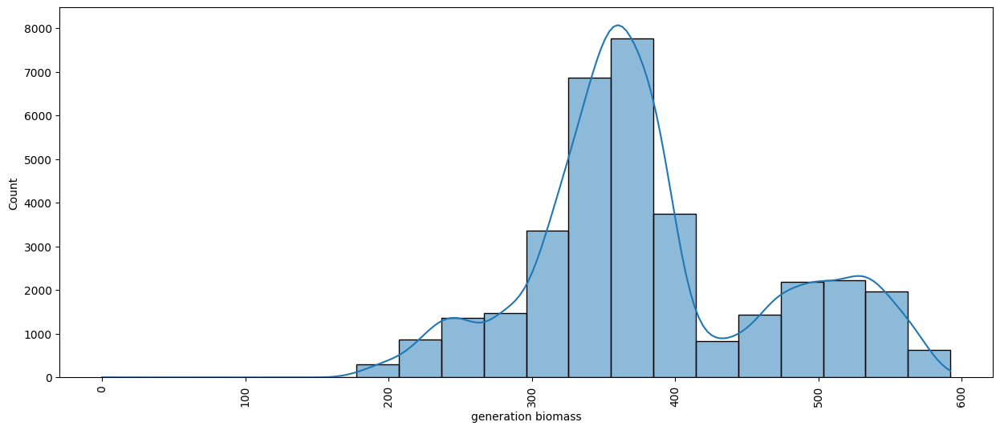

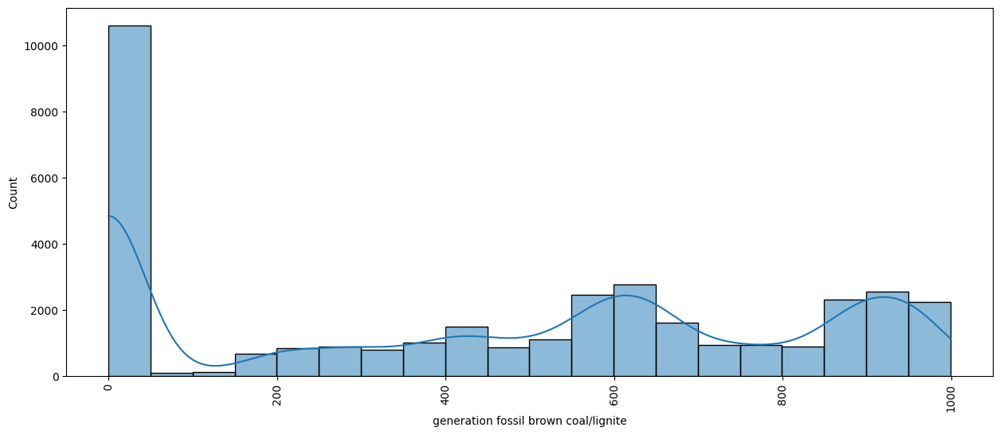

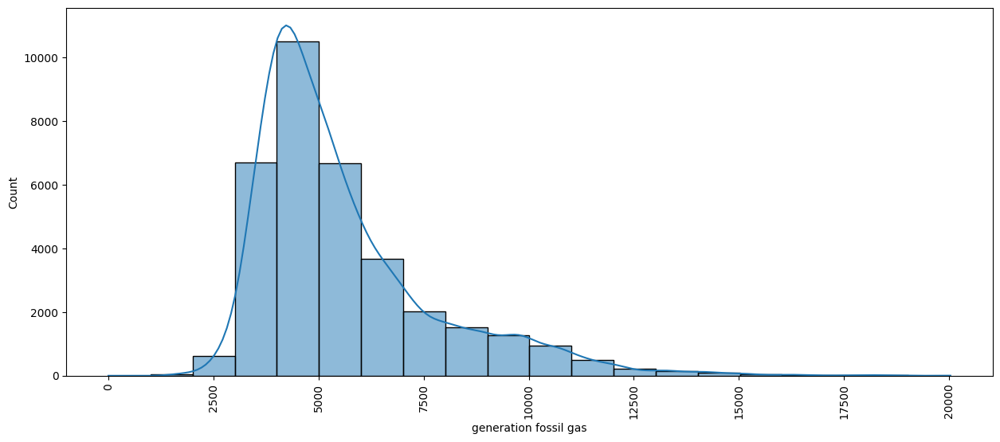

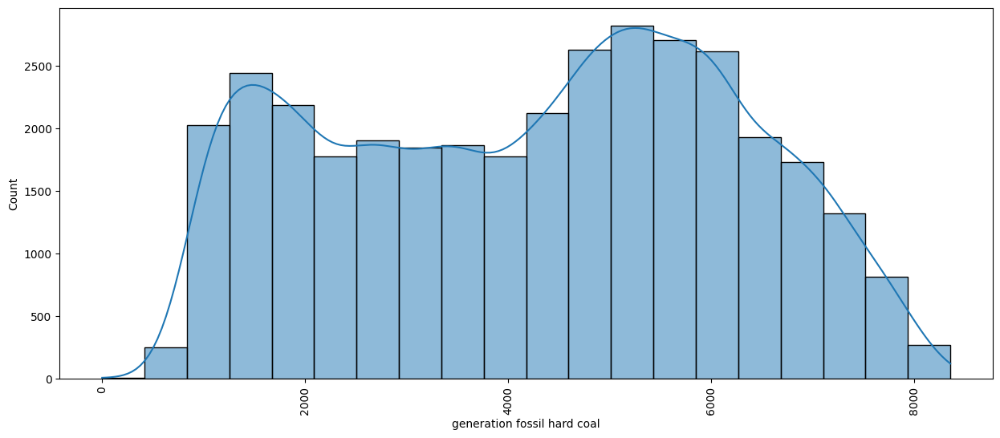

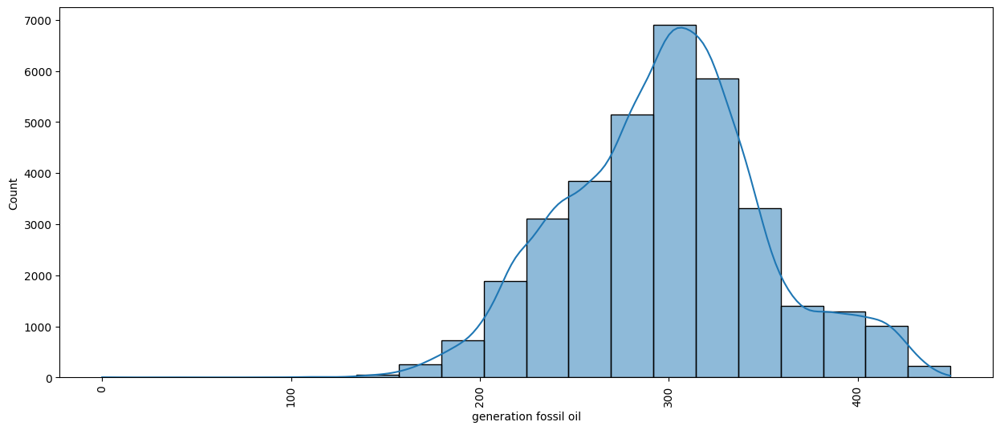

...

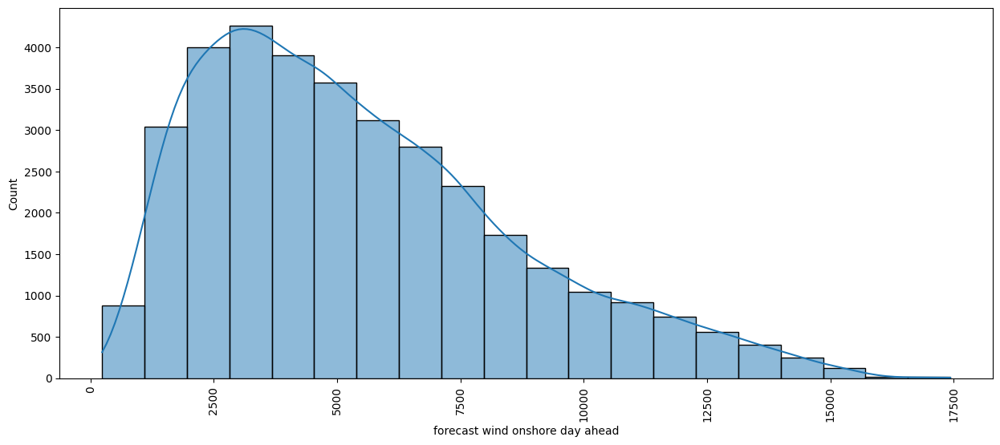

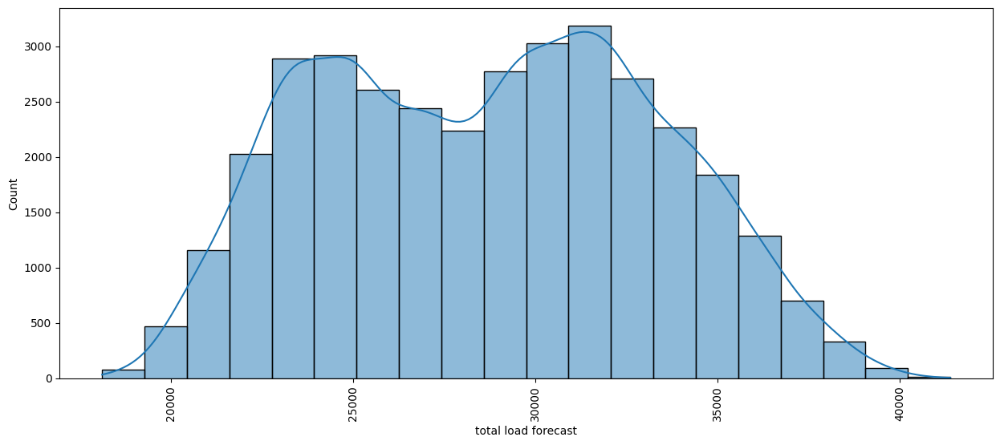

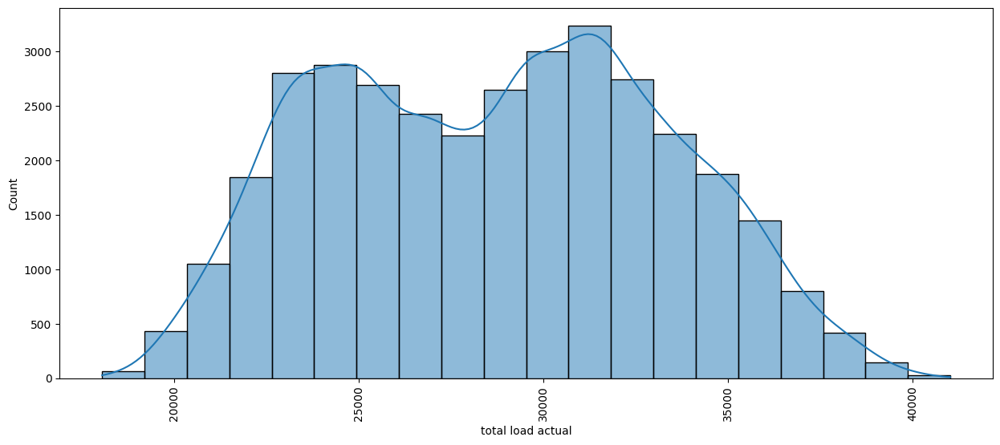

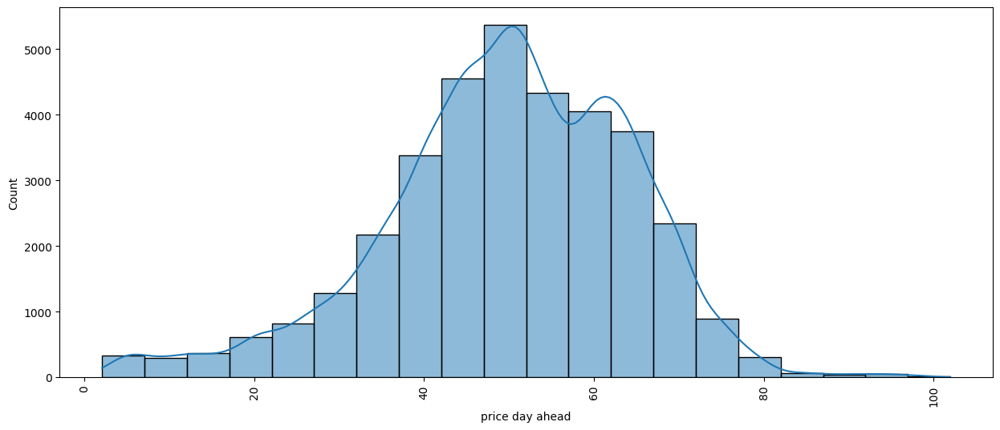

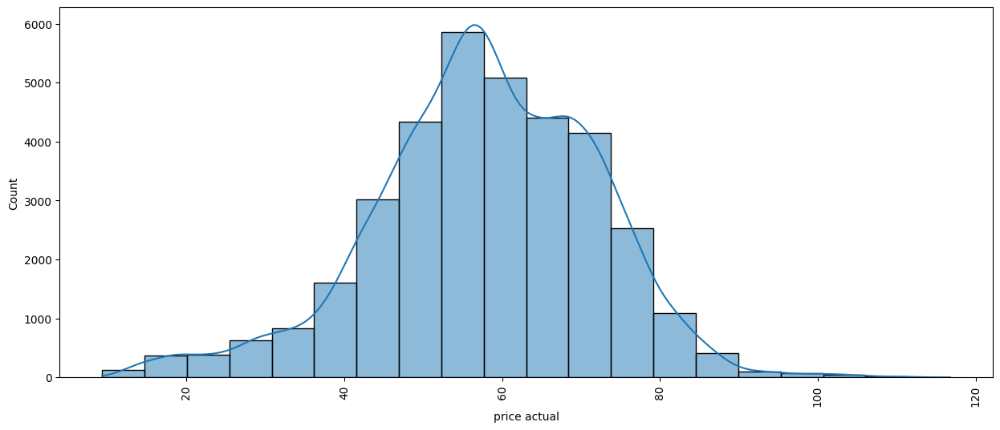

In [24]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i], bins = 20, kde = True, palette='hls')
    plt.xticks(rotation = 90)
    plt.show()

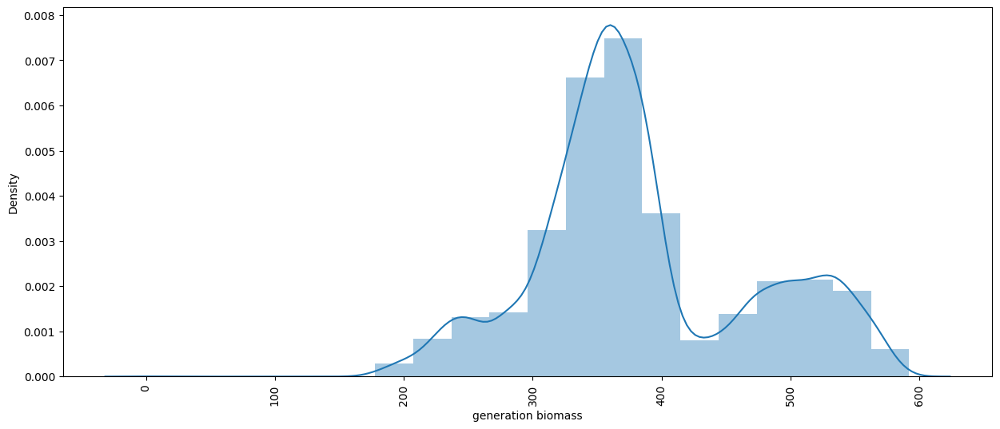

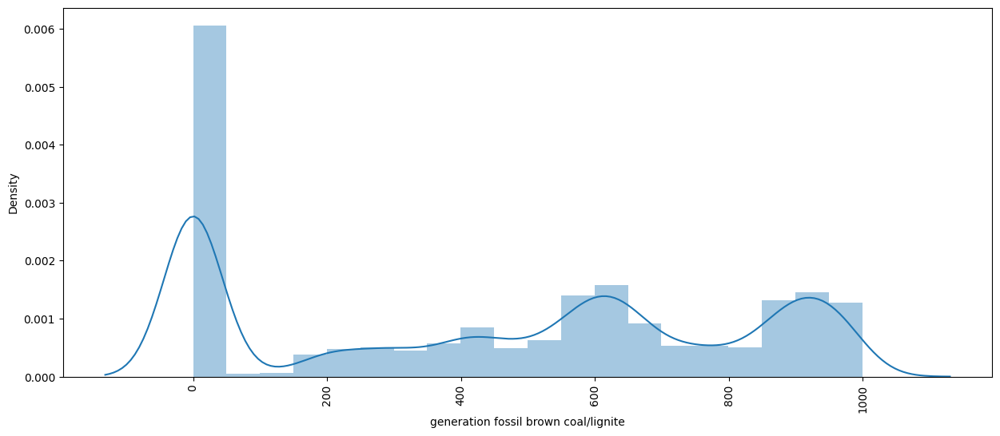

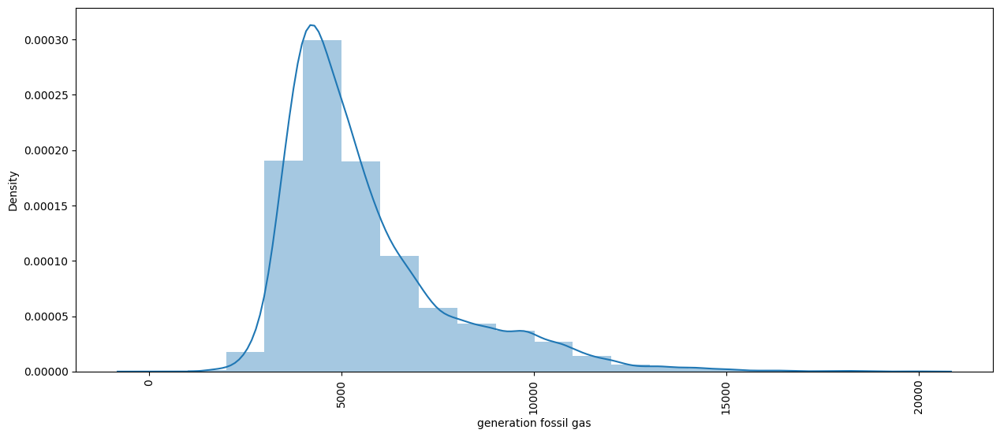

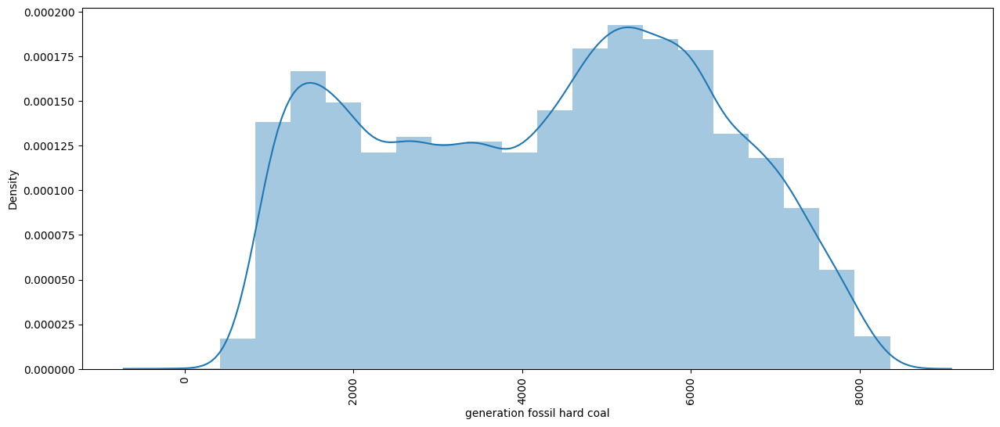

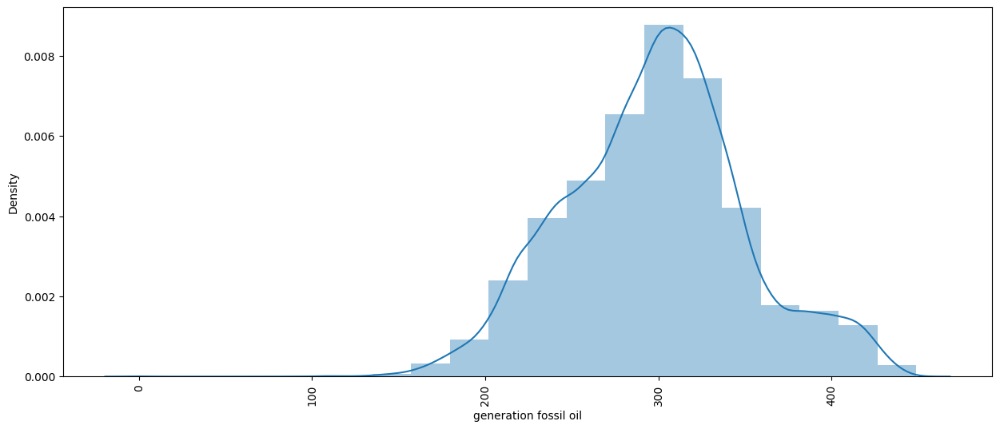

...

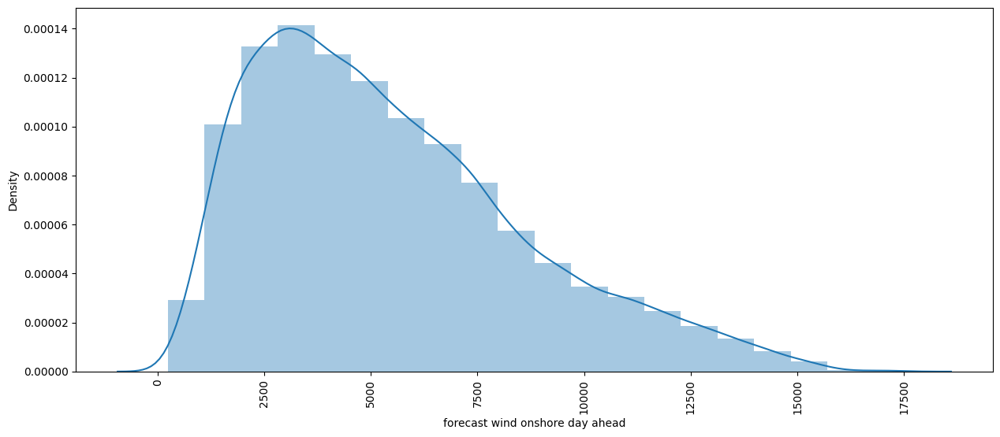

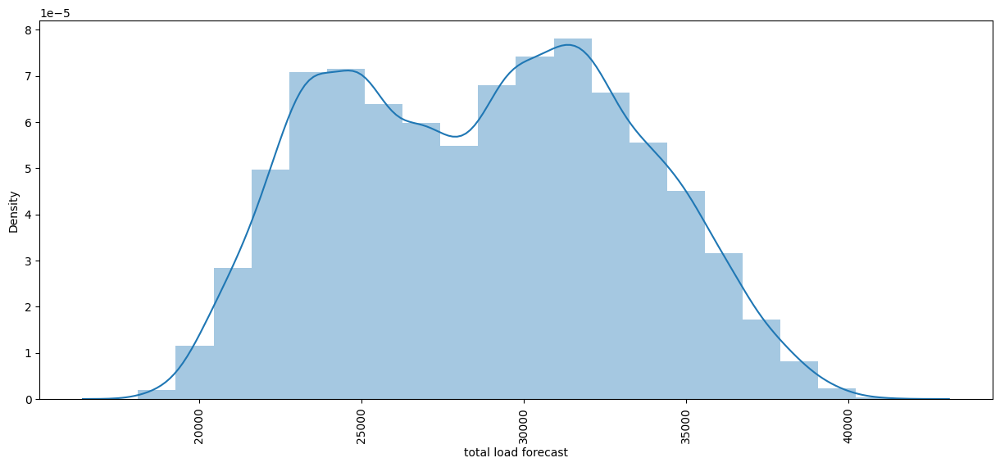

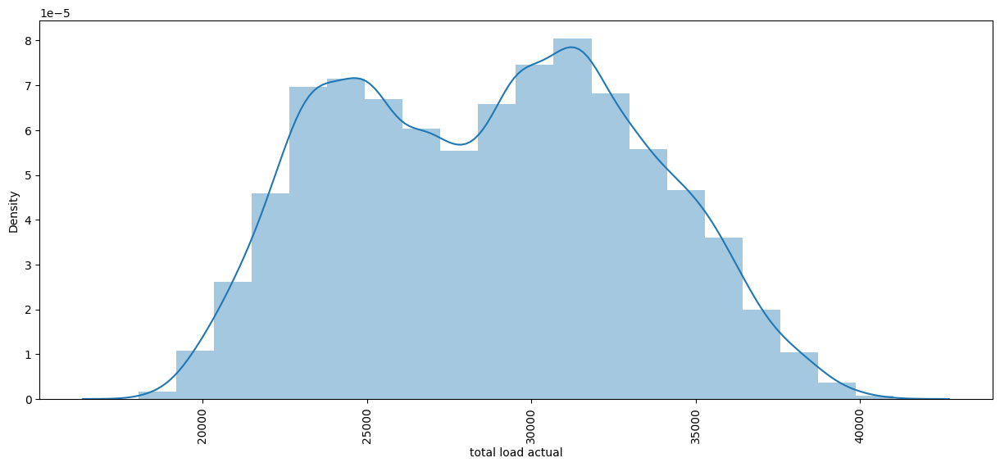

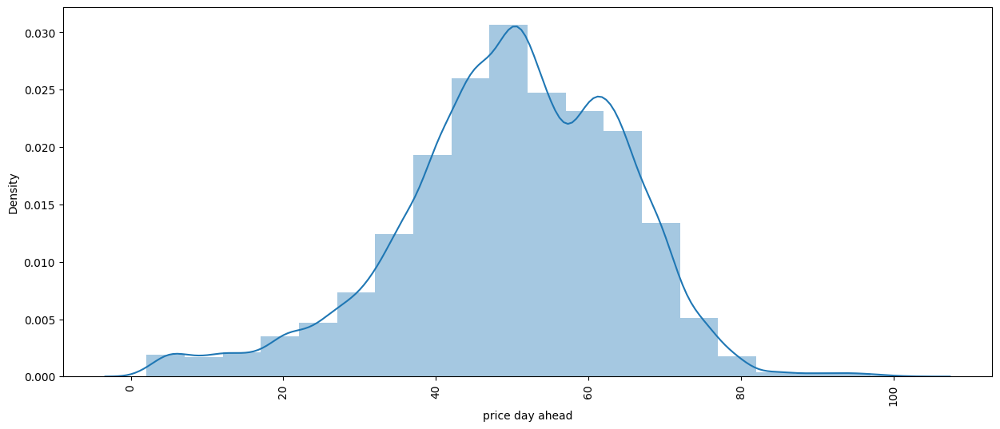

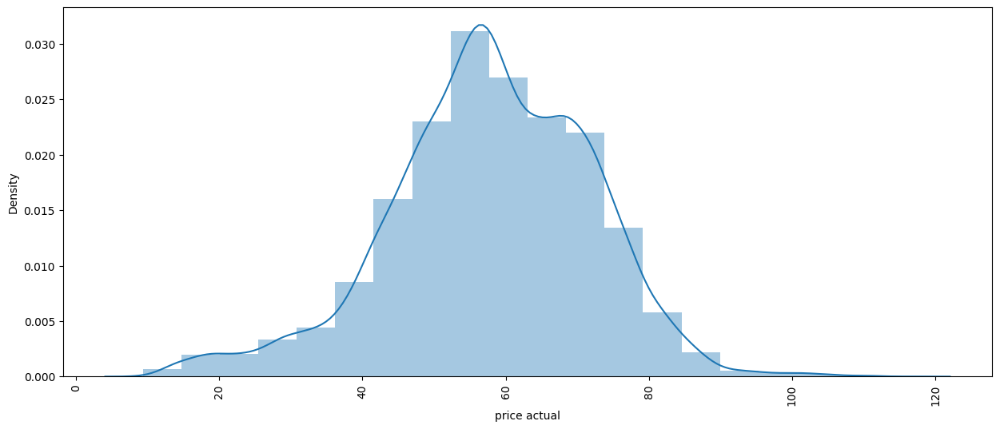

In [25]:
for i in continuous:
    plt.figure(figsize=(15,6))
    sns.distplot(df[i], bins = 20, kde = True)
    plt.xticks(rotation = 90)
    plt.show()

In [26]:
skewness = df[continuous].skew()
skewness

generation biomass                             0.421013
generation fossil brown coal/lignite          -0.046831
generation fossil gas                          1.615447
generation fossil hard coal                   -0.073691
generation fossil oil                          0.064469
generation hydro pumped storage consumption    2.130588
generation hydro run-of-river and poundage     0.500928
generation hydro water reservoir               0.897036
generation nuclear                            -0.691683
generation other                              -0.506196
generation other renewable                    -0.216073
generation solar                               1.020388
generation waste                              -0.849129
generation wind onshore                        0.785008
forecast solar day ahead                       0.990018
forecast wind onshore day ahead                0.800419
total load forecast                            0.059873
total load actual                              0

The skewness of a feature helps us understand the relationship between the **mean**, **median**, and **mode** of its distribution. 

### General Interpretation of Skewness:
1. **Positive Skewness (Skewness > 0)**: 
   - The distribution is right-skewed (long tail on the right).
   - **Mean > Median > Mode**.
   - The mean is pulled toward the tail (right side).
   
2. **Negative Skewness (Skewness < 0)**: 
   - The distribution is left-skewed (long tail on the left).
   - **Mean < Median < Mode**.
   - The mean is pulled toward the tail (left side).

3. **Near Zero Skewness (Skewness ≈ 0)**: 
   - The distribution is approximately symmetric.
   - **Mean ≈ Median ≈ Mode**.

### Interpreting the Skewness of Your Features:
1. **generation biomass (0.421)**: 
   - Positively skewed.
   - **Mean > Median > Mode**.

2. **generation fossil brown coal/lignite (-0.046)**: 
   - Slightly negatively skewed (close to zero, almost symmetric).
   - **Mean ≈ Median ≈ Mode**.

3. **generation fossil gas (1.615)**:
   - Highly positively skewed.
   - **Mean > Median > Mode** (strong right skew).

4. **generation fossil hard coal (-0.073)**:
   - Slightly negatively skewed (close to zero).
   - **Mean ≈ Median ≈ Mode**.

5. **generation fossil oil (0.064)**:
   - Slightly positively skewed (close to zero).
   - **Mean ≈ Median ≈ Mode**.

6. **generation hydro pumped storage consumption (2.130)**:
   - Strong positive skewness.
   - **Mean > Median > Mode** (long right tail).

7. **generation hydro run-of-river and poundage (0.500)**:
   - Positively skewed.
   - **Mean > Median > Mode**.

8. **generation hydro water reservoir (0.897)**:
   - Positively skewed.
   - **Mean > Median > Mode**.

9. **generation nuclear (-0.692)**:
   - Negatively skewed.
   - **Mean < Median < Mode**.

10. **generation other (-0.506)**:
    - Negatively skewed.
    - **Mean < Median < Mode**.

11. **generation other renewable (-0.216)**:
    - Slightly negatively skewed.
    - **Mean < Median < Mode**.

12. **generation solar (1.020)**:
    - Positively skewed.
    - **Mean > Median > Mode**.

13. **generation waste (-0.849)**:
    - Negatively skewed.
    - **Mean < Median < Mode**.

14. **generation wind onshore (0.785)**:
    - Positively skewed.
    - **Mean > Median > Mode**.

15. **forecast solar day ahead (0.990)**:
    - Positively skewed.
    - **Mean > Median > Mode**.

16. **forecast wind onshore day ahead (0.800)**:
    - Positively skewed.
    - **Mean > Median > Mode**.

17. **total load forecast (0.059)**:
    - Slightly positively skewed (close to zero).
    - **Mean ≈ Median ≈ Mode**.

18. **total load actual (0.062)**:
    - Slightly positively skewed (close to zero).
    - **Mean ≈ Median ≈ Mode**.

19. **price day ahead (-0.487)**:
    - Negatively skewed.
    - **Mean < Median < Mode**.

20. **price actual (-0.323)**:
    - Negatively skewed.
    - **Mean < Median < Mode**.

### Summary:
- **Positively skewed features**: The mean will be greater than the median, which will be greater than the mode. These features have a right tail.
- **Negatively skewed features**: The mean will be less than the median, which will be less than the mode. These features have a left tail.
- **Nearly symmetric features**: The mean, median, and mode will be roughly the same.

By knowing the skewness, you can anticipate how the distribution of each feature behaves and how central tendency measures like the mean, median, and mode relate to each other.

To perform imputation on continuous features based on their skewness, different strategies can be applied:

1. **For positively skewed features** (Skewness > 0):
   - Use the **median** for imputation, as the median is less affected by extreme values (long tail on the right).

2. **For negatively skewed features** (Skewness < 0):
   - Use the **mean** for imputation, as the mean is often closer to the bulk of the data (long tail on the left).

3. **For approximately symmetric features** (Skewness ≈ 0):
   - Either the **mean** or **median** can be used for imputation.

### Explanation:
- **Positively skewed features** are imputed using the **median** because the median is a better representative of the central tendency in a right-skewed distribution.
- **Negatively skewed features** are imputed using the **mean** because the mean is closer to the bulk of the data in left-skewed distributions.
- **Approximately symmetric features** can be imputed using either the **mean** or **median**. In this code, I chose the mean for symmetric features.

This approach ensures that the imputation aligns with the characteristics of the data's distribution.

def impute_continuous_features(df, feature, skew_value):
    if skew_value > 0:  
        median_value = df[feature].median()
        df[feature].fillna(median_value, inplace=True)
    elif skew_value < 0:  
        mean_value = df[feature].mean()
        df[feature].fillna(mean_value, inplace=True)
    else:  
        mean_value = df[feature].mean()
        df[feature].fillna(mean_value, inplace=True)

for feature in continuous:
    impute_continuous_features(df, feature, skewness[feature])

In [27]:
def impute_continuous_features(df, feature, skew_value):
    if skew_value > 2 or skew_value < -2:  
        median_value = df[feature].median()
        df[feature].fillna(median_value, inplace=True)
    elif skew_value > 1 or skew_value < -1:  
        mean_value = df[feature].mean()
        df[feature].fillna(mean_value, inplace=True)
    elif skew_value > 0.5 or skew_value < -0.5:  
        mean_value = df[feature].mean()
        df[feature].fillna(mean_value, inplace=True)
    else:  
        mean_value = df[feature].mean()
        df[feature].fillna(mean_value, inplace=True)

for feature in continuous:
    impute_continuous_features(df, feature, skewness[feature])

In [28]:
print(df[continuous].isnull().sum())

generation biomass                             0
generation fossil brown coal/lignite           0
generation fossil gas                          0
generation fossil hard coal                    0
generation fossil oil                          0
generation hydro pumped storage consumption    0
generation hydro run-of-river and poundage     0
generation hydro water reservoir               0
generation nuclear                             0
generation other                               0
generation other renewable                     0
generation solar                               0
generation waste                               0
generation wind onshore                        0
forecast solar day ahead                       0
forecast wind onshore day ahead                0
total load forecast                            0
total load actual                              0
price day ahead                                0
price actual                                   0
dtype: int64


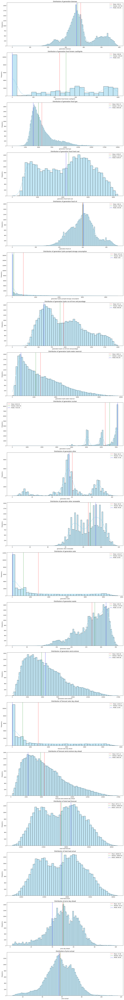

In [29]:
plt.figure(figsize=(15, len(continuous) * 6))

for i, feature in enumerate(continuous, 1):
    plt.subplot(len(continuous), 1, i)
    sns.histplot(df[feature], kde=True, color='skyblue')
    
    mean = df[feature].mean()
    median = df[feature].median()
    mode = df[feature].mode()[0]
    
    plt.axvline(mean, color='r', linestyle='--', label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='g', linestyle='--', label=f'Median: {median:.2f}')
    plt.axvline(mode, color='b', linestyle='--', label=f'Mode: {mode:.2f}')
    
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

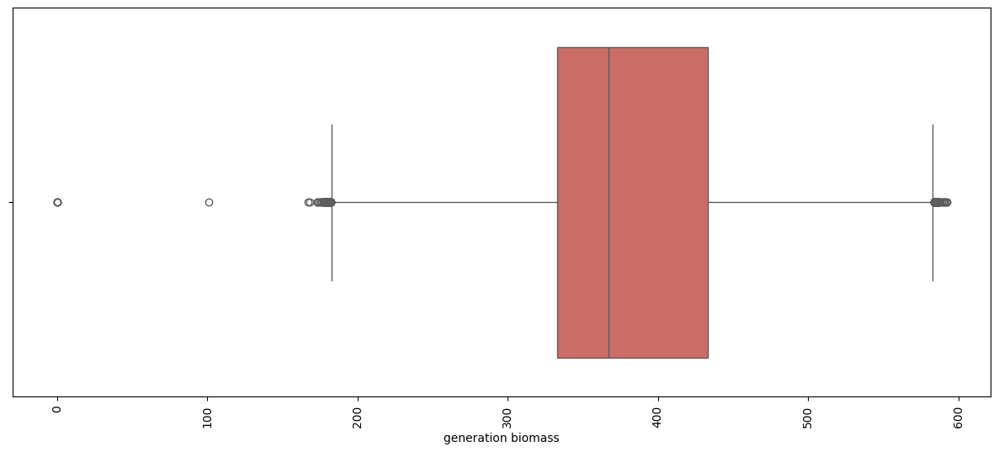

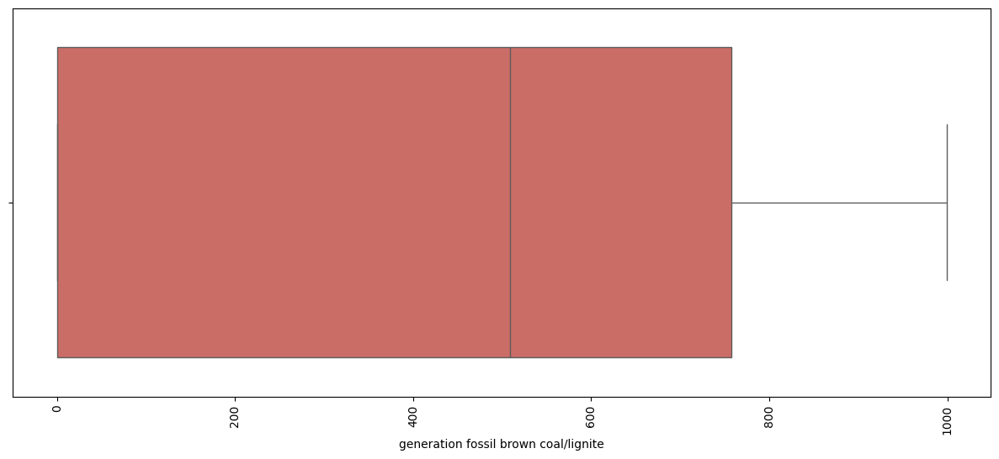

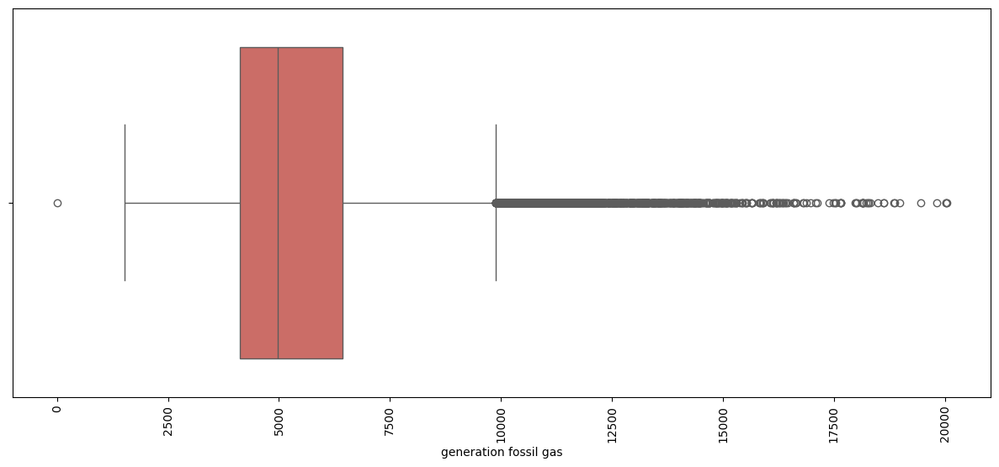

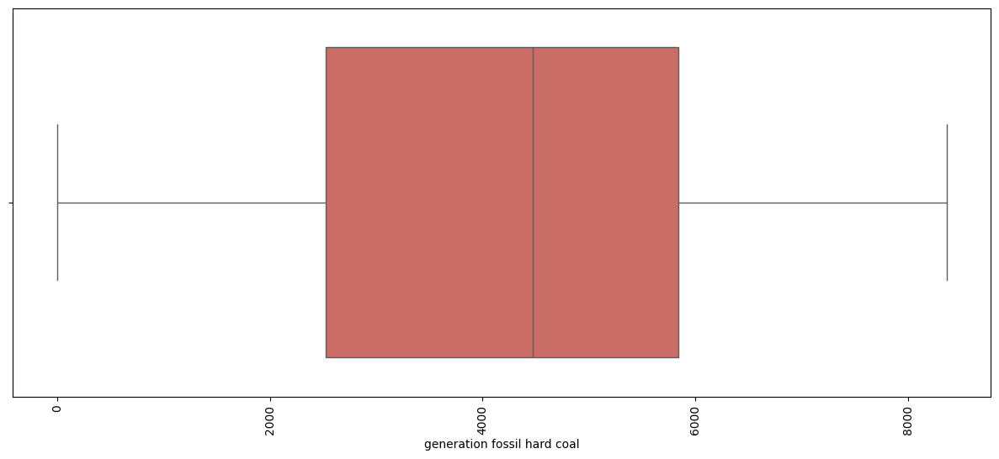

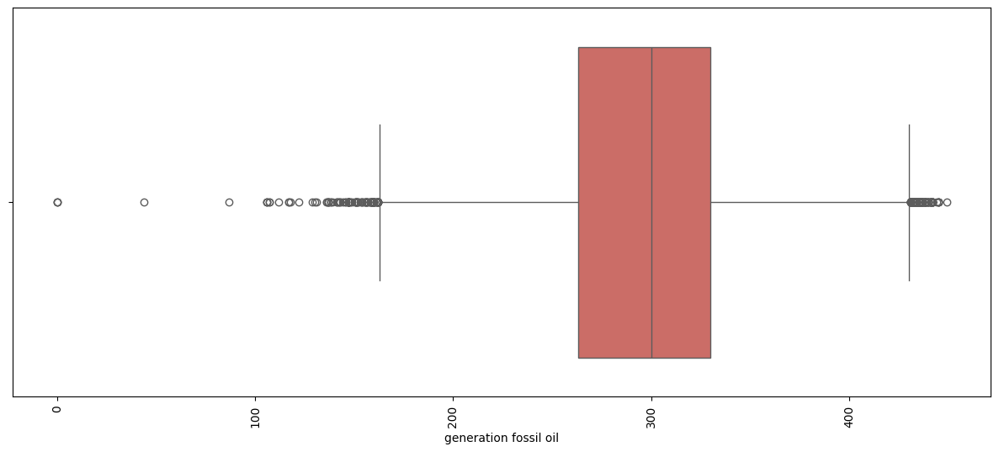

...

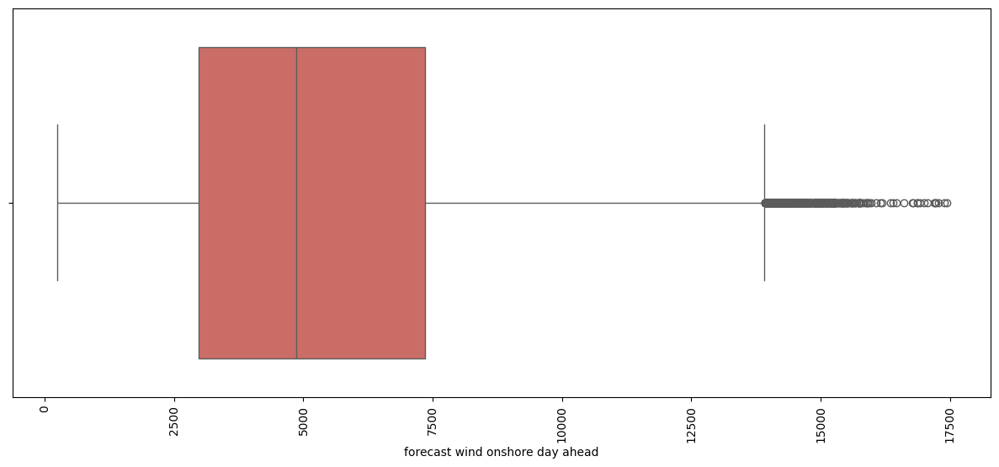

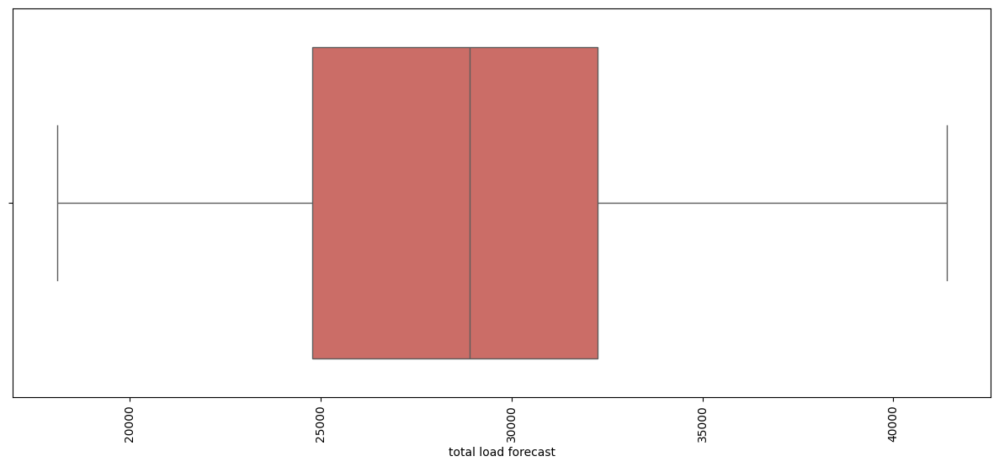

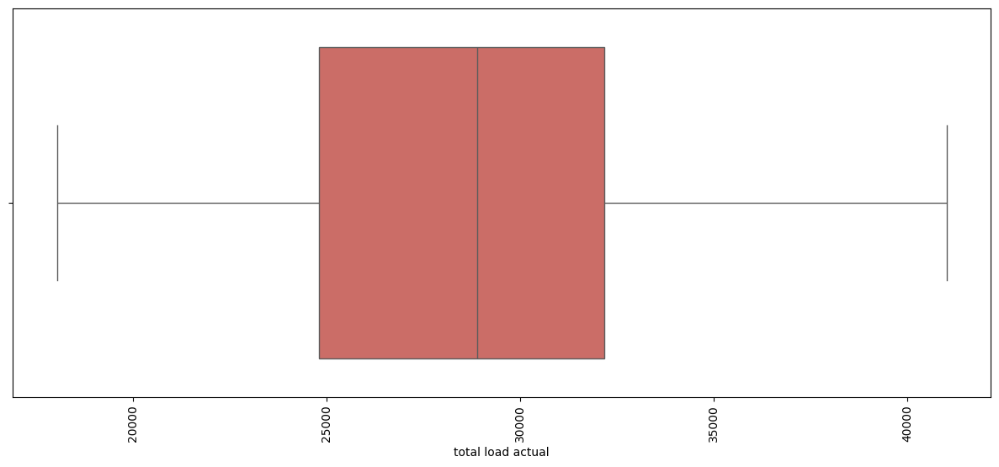

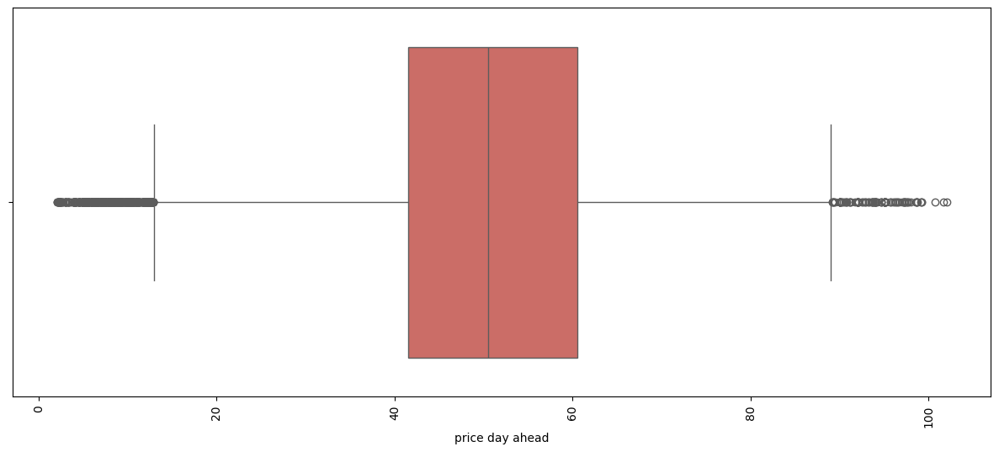

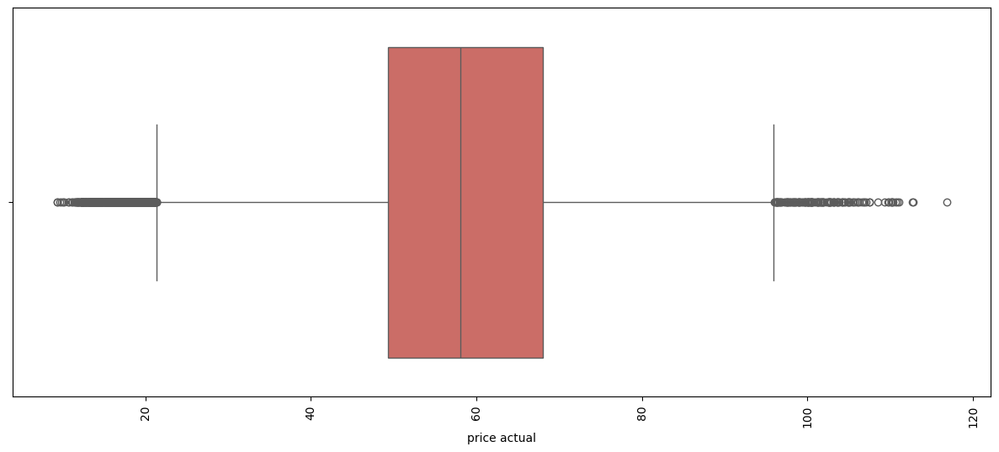

In [30]:
for i in continuous:
    plt.figure(figsize=(15, 6))
    sns.boxplot(x=i, data=df, palette='hls')
    plt.xticks(rotation=90)
    plt.show()

In [31]:
def find_outliers_iqr(df, feature):

    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    outliers = df[(df[feature] < lower_bound) | (df[feature] > upper_bound)]
    
    return outliers

outliers_dict = {}

for feature in continuous:
    outliers = find_outliers_iqr(df, feature)
    if not outliers.empty:
        outliers_dict[feature] = outliers

for feature, outliers in outliers_dict.items():
    print(f"Feature: {feature}, Number of Outliers: {len(outliers)}")

Feature: generation biomass, Number of Outliers: 87
Feature: generation fossil gas, Number of Outliers: 2187
Feature: generation fossil oil, Number of Outliers: 246
Feature: generation hydro pumped storage consumption, Number of Outliers: 3772
Feature: generation hydro water reservoir, Number of Outliers: 344
Feature: generation nuclear, Number of Outliers: 76
Feature: generation other, Number of Outliers: 1267
Feature: generation other renewable, Number of Outliers: 5
Feature: generation waste, Number of Outliers: 328
Feature: generation wind onshore, Number of Outliers: 380
Feature: forecast wind onshore day ahead, Number of Outliers: 436
Feature: price day ahead, Number of Outliers: 841
Feature: price actual, Number of Outliers: 699


In [32]:
def remove_outliers_iqr(df, feature):
    Q1 = df[feature].quantile(0.25)
    Q3 = df[feature].quantile(0.75)
    
    IQR = Q3 - Q1
    
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    filtered_df = df[(df[feature] >= lower_bound) & (df[feature] <= upper_bound)]
    
    return filtered_df

df_cleaned = df.copy()  
for feature in continuous:
    df_cleaned = remove_outliers_iqr(df_cleaned, feature)

print("Number of rows before removing outliers:", len(df))
print("Number of rows after removing outliers:", len(df_cleaned))

Number of rows before removing outliers: 35064
Number of rows after removing outliers: 25912


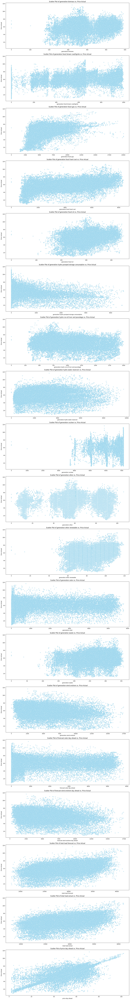

In [33]:
continuous_features = [feature for feature in continuous if feature != 'price actual']

plt.figure(figsize=(15, len(continuous_features) * 6))

for i, feature in enumerate(continuous_features, 1):
    plt.subplot(len(continuous_features), 1, i)
    sns.scatterplot(x=df[feature], y=df['price actual'], color='skyblue', alpha=0.6)
    
    plt.title(f'Scatter Plot of {feature} vs. Price Actual')
    plt.xlabel(feature)
    plt.ylabel('Price Actual')

plt.tight_layout()
plt.show()

In [34]:
corr_matrix = df[continuous].corr()

In [35]:
corr_matrix

,generation biomass,generation fossil brown coal/lignite,generation fossil gas,generation fossil hard coal,generation fossil oil,generation hydro pumped storage consumption,generation hydro run-of-river and poundage,generation hydro water reservoir,generation nuclear,generation other,generation other renewable,generation solar,generation waste,generation wind onshore,forecast solar day ahead,forecast wind onshore day ahead,total load forecast,total load actual,price day ahead,price actual
generation biomass,1.000000,0.229804,-0.021660,0.433522,0.459527,-0.044888,-0.284876,-0.033674,-0.021278,0.658488,-0.560588,-0.004687,-0.346322,-0.068658,-0.008711,-0.072350,0.085162,0.083188,0.108907,0.142303
generation fossil brown coal/lignite,0.229804,1.000000,0.499808,0.768710,0.314868,-0.323752,-0.525003,-0.229455,-0.008440,0.097600,0.104552,0.040447,0.282803,-0.434118,0.042294,-0.435927,0.278333,0.280323,0.567709,0.363919
generation fossil gas,-0.021660,0.499808,1.000000,0.541635,0.309623,-0.420623,-0.271527,0.060173,-0.112903,-0.066279,0.334880,0.074716,0.275049,-0.397298,0.080149,-0.397209,0.543378,0.548620,0.640674,0.461492
generation fossil hard coal,0.433522,0.768710,0.541635,1.000000,0.440831,-0.406095,-0.497933,-0.157677,-0.023930,0.264383,-0.019426,0.046185,0.170229,-0.441853,0.047343,-0.444384,0.394049,0.396294,0.671364,0.465426
generation fossil oil,0.459527,0.314868,0.309623,0.440831,1.000000,-0.330992,-0.106752,0.160464,0.015618,0.375045,-0.115087,0.100210,-0.175737,-0.051787,0.096407,-0.058229,0.498328,0.496299,0.292687,0.284545
generation hydro pumped storage consumption,-0.044888,-0.323752,-0.420623,-0.406095,-0.330992,1.000000,0.053178,-0.234312,0.013056,0.021508,-0.267425,-0.214618,-0.188081,0.389033,-0.222099,0.390254,-0.559461,-0.562630,-0.600260,-0.426505
generation hydro run-of-river and poundage,-0.284876,-0.525003,-0.271527,-0.497933,-0.106752,0.053178,1.000000,0.652764,-0.124040,-0.127339,0.053435,0.039601,-0.286090,0.223153,0.045054,0.226359,0.120494,0.118493,-0.294614,-0.137042
generation hydro water reservoir,-0.033674,-0.229455,0.060173,-0.157677,0.160464,-0.234312,0.652764,1.000000,-0.049558,0.065099,-0.065737,0.091834,-0.288255,-0.019231,0.103045,-0.011542,0.476278,0.479126,-0.017801,0.071516
generation nuclear,-0.021278,-0.008440,-0.112903,-0.023930,0.015618,0.013056,-0.124040,-0.049558,1.000000,0.041155,-0.062523,0.004388,0.086621,0.049166,-0.000334,0.045538,0.089929,0.085474,-0.044174,-0.052571
generation other,0.658488,0.097600,-0.066279,0.264383,0.375045,0.021508,-0.127339,0.065099,0.041155,1.000000,-0.443731,-0.016562,-0.360591,0.047718,-0.019149,0.044913,0.101250,0.100614,0.043584,0.100002


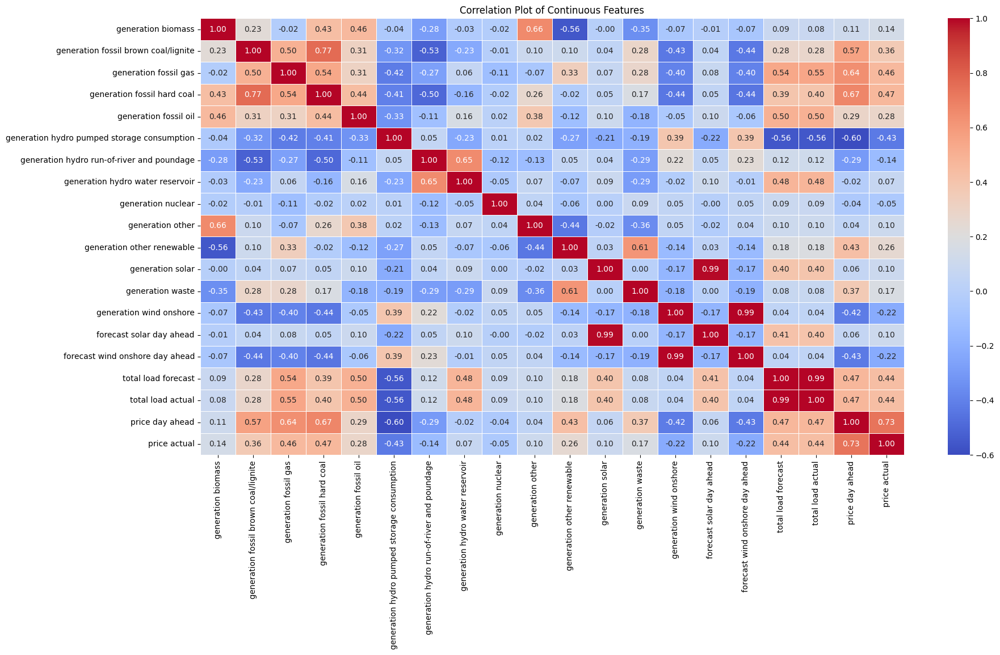

In [36]:
plt.figure(figsize=(20, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Plot of Continuous Features')
plt.show()

In [37]:
target_feature = 'price actual'

In [38]:
target_correlation = corr_matrix[target_feature].drop(target_feature)

In [39]:
print(target_correlation.sort_values(ascending=False).to_string())

price day ahead                                0.732155
generation fossil hard coal                    0.465426
generation fossil gas                          0.461492
total load forecast                            0.435864
total load actual                              0.435540
generation fossil brown coal/lignite           0.363919
generation fossil oil                          0.284545
generation other renewable                     0.256062
generation waste                               0.169514
generation biomass                             0.142303
forecast solar day ahead                       0.101402
generation other                               0.100002
generation solar                               0.098442
generation hydro water reservoir               0.071516
generation nuclear                            -0.052571
generation hydro run-of-river and poundage    -0.137042
generation wind onshore                       -0.220727
forecast wind onshore day ahead               -0

In [40]:
correlation_matrix = corr_matrix

In [41]:
threshold = 0.8
highly_correlated_features = set()
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            colname = correlation_matrix.columns[i]
            highly_correlated_features.add(colname)
            highly_correlated_features.add(correlation_matrix.columns[j])

In [42]:
features_to_drop = []
for feature in highly_correlated_features:
    correlated_features = correlation_matrix[abs(correlation_matrix[feature]) > threshold].index
    correlated_features = correlated_features[correlated_features != feature]  
    min_correlation_with_target = target_correlation[correlated_features].abs().min()
    feature_to_drop = target_correlation[correlated_features].abs().idxmin()
    if target_correlation[feature] < min_correlation_with_target:
        features_to_drop.append(feature)

In [43]:
features_to_drop

['generation wind onshore',
 'forecast wind onshore day ahead',
 'total load actual',
 'generation solar']

In [44]:
df_cleaned = df.drop(columns=features_to_drop)

In [45]:
df_cleaned 

,time,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,...,generation marine,generation nuclear,generation other,generation other renewable,generation waste,generation wind offshore,forecast solar day ahead,total load forecast,price day ahead,price actual
0,2015-01-01 00:00:00+01:00,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,...,0.0,7096.0,43.0,73.0,196.0,0.0,17,26118,50.10,65.41
1,2015-01-01 01:00:00+01:00,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,...,0.0,7096.0,43.0,71.0,195.0,0.0,16,24934,48.10,64.92
2,2015-01-01 02:00:00+01:00,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,...,0.0,7099.0,43.0,73.0,196.0,0.0,8,23515,47.33,64.48
3,2015-01-01 03:00:00+01:00,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,...,0.0,7098.0,43.0,75.0,191.0,0.0,2,22642,42.27,59.32
4,2015-01-01 04:00:00+01:00,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,...,0.0,7097.0,43.0,74.0,189.0,0.0,9,21785,38.41,56.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,2018-12-31 19:00:00+01:00,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,...,0.0,6073.0,63.0,95.0,277.0,0.0,96,30619,68.85,77.02
35060,2018-12-31 20:00:00+01:00,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,...,0.0,6074.0,62.0,95.0,280.0,0.0,51,29932,68.40,76.16
35061,2018-12-31 21:00:00+01:00,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,...,0.0,6076.0,61.0,94.0,286.0,0.0,36,27903,66.88,74.30
35062,2018-12-31 22:00:00+01:00,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,...,0.0,6075.0,61.0,93.0,287.0,0.0,29,25450,63.93,69.89


In [46]:
df_cleaned.columns

Index(['time', 'generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation waste', 'generation wind offshore',
       'forecast solar day ahead', 'total load forecast', 'price day ahead',
       'price actual'],
      dtype='object')

In [47]:
pattern = r'(?P<year>\d{4})-(?P<month>\d{2})-(?P<day>\d{2}) (?P<hour>\d{2}):'

df_extracted = df_cleaned['time'].str.extract(pattern)

df_extracted = df_extracted.astype(int)

df_new = pd.concat([df_cleaned, df_extracted], axis=1)

In [48]:
df_new = df_new.drop('time', axis = 1)

In [49]:
df_new

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage consumption,...,generation waste,generation wind offshore,forecast solar day ahead,total load forecast,price day ahead,price actual,year,month,day,hour
0,447.0,329.0,0.0,4844.0,4821.0,162.0,0.0,0.0,0.0,863.0,...,196.0,0.0,17,26118,50.10,65.41,2015,1,1,0
1,449.0,328.0,0.0,5196.0,4755.0,158.0,0.0,0.0,0.0,920.0,...,195.0,0.0,16,24934,48.10,64.92,2015,1,1,1
2,448.0,323.0,0.0,4857.0,4581.0,157.0,0.0,0.0,0.0,1164.0,...,196.0,0.0,8,23515,47.33,64.48,2015,1,1,2
3,438.0,254.0,0.0,4314.0,4131.0,160.0,0.0,0.0,0.0,1503.0,...,191.0,0.0,2,22642,42.27,59.32,2015,1,1,3
4,428.0,187.0,0.0,4130.0,3840.0,156.0,0.0,0.0,0.0,1826.0,...,189.0,0.0,9,21785,38.41,56.04,2015,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,297.0,0.0,0.0,7634.0,2628.0,178.0,0.0,0.0,0.0,1.0,...,277.0,0.0,96,30619,68.85,77.02,2018,12,31,19
35060,296.0,0.0,0.0,7241.0,2566.0,174.0,0.0,0.0,0.0,1.0,...,280.0,0.0,51,29932,68.40,76.16,2018,12,31,20
35061,292.0,0.0,0.0,7025.0,2422.0,168.0,0.0,0.0,0.0,50.0,...,286.0,0.0,36,27903,66.88,74.30,2018,12,31,21
35062,293.0,0.0,0.0,6562.0,2293.0,163.0,0.0,0.0,0.0,108.0,...,287.0,0.0,29,25450,63.93,69.89,2018,12,31,22


In [50]:
df_new.columns

Index(['generation biomass', 'generation fossil brown coal/lignite',
       'generation fossil coal-derived gas', 'generation fossil gas',
       'generation fossil hard coal', 'generation fossil oil',
       'generation fossil oil shale', 'generation fossil peat',
       'generation geothermal', 'generation hydro pumped storage consumption',
       'generation hydro run-of-river and poundage',
       'generation hydro water reservoir', 'generation marine',
       'generation nuclear', 'generation other', 'generation other renewable',
       'generation waste', 'generation wind offshore',
       'forecast solar day ahead', 'total load forecast', 'price day ahead',
       'price actual', 'year', 'month', 'day', 'hour'],
      dtype='object')

In [51]:
df1 = df_new.copy()

In [52]:
df2 = df_new.copy()

In [53]:
categorical, non_categorical, discrete, continuous = classify_features(df1)

In [54]:
epsilon = 1

for feature in continuous:
    df1[feature] = np.log(df1[feature] + epsilon)

In [55]:
df1

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage consumption,...,generation waste,generation wind offshore,forecast solar day ahead,total load forecast,price day ahead,price actual,year,month,day,hour
0,6.104793,5.799093,0.0,8.485703,8.480944,5.093750,0.0,0.0,0.0,6.761573,...,5.283204,0.0,2.890372,10.170418,3.933784,4.195848,2015,1,1,0
1,6.109248,5.796058,0.0,8.555837,8.467162,5.068904,0.0,0.0,0.0,6.825460,...,5.278115,0.0,2.833213,10.124028,3.893859,4.188442,2015,1,1,1
2,6.107023,5.780744,0.0,8.488382,8.429891,5.062595,0.0,0.0,0.0,7.060476,...,5.283204,0.0,2.197225,10.065436,3.878052,4.181745,2015,1,1,2
3,6.084499,5.541264,0.0,8.369853,8.326517,5.081404,0.0,0.0,0.0,7.315884,...,5.257495,0.0,1.098612,10.027606,3.767460,4.099664,2015,1,1,3
4,6.061457,5.236442,0.0,8.326275,8.253488,5.056246,0.0,0.0,0.0,7.510431,...,5.247024,0.0,2.302585,9.989023,3.674020,4.043753,2015,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,5.697093,0.000000,0.0,8.940498,7.874359,5.187386,0.0,0.0,0.0,0.693147,...,5.627621,0.0,4.574711,10.329409,4.246350,4.356965,2018,12,31,19
35060,5.693732,0.000000,0.0,8.887653,7.850493,5.164786,0.0,0.0,0.0,0.693147,...,5.638355,0.0,3.951244,10.306717,4.239887,4.345881,2018,12,31,20
35061,5.680173,0.000000,0.0,8.857373,7.792762,5.129899,0.0,0.0,0.0,3.931826,...,5.659482,0.0,3.610918,10.236525,4.217741,4.321480,2018,12,31,21
35062,5.683580,0.000000,0.0,8.789203,7.738052,5.099866,0.0,0.0,0.0,4.691348,...,5.662960,0.0,3.401197,10.144510,4.173310,4.261129,2018,12,31,22


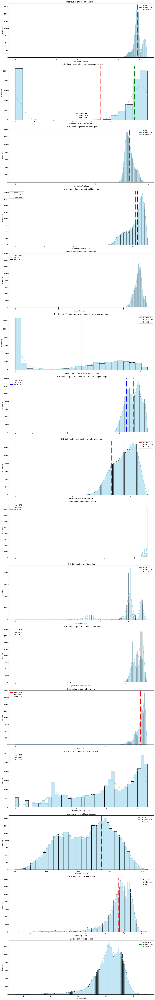

In [56]:
plt.figure(figsize=(15, 6 * len(continuous)))

for i, feature in enumerate(continuous, 1):
    plt.subplot(len(continuous), 1, i)
    sns.histplot(df1[feature], kde=True, color='skyblue')
    
    mean = df1[feature].mean()
    median = df1[feature].median()
    mode = df1[feature].mode()[0]
    
    plt.axvline(mean, color='r', linestyle='--', label=f'Mean: {mean:.2f}')
    plt.axvline(median, color='g', linestyle='--', label=f'Median: {median:.2f}')
    plt.axvline(mode, color='b', linestyle='--', label=f'Mode: {mode:.2f}')
    
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.legend()

plt.tight_layout()
plt.show()

In [57]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [58]:
features = df1.drop(columns=['price actual'])  
target = df1['price actual']

In [59]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

In [60]:
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [61]:
y_pred = model.predict(X_test)

In [62]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Mean Squared Error: 0.04
R^2 Score: 0.54


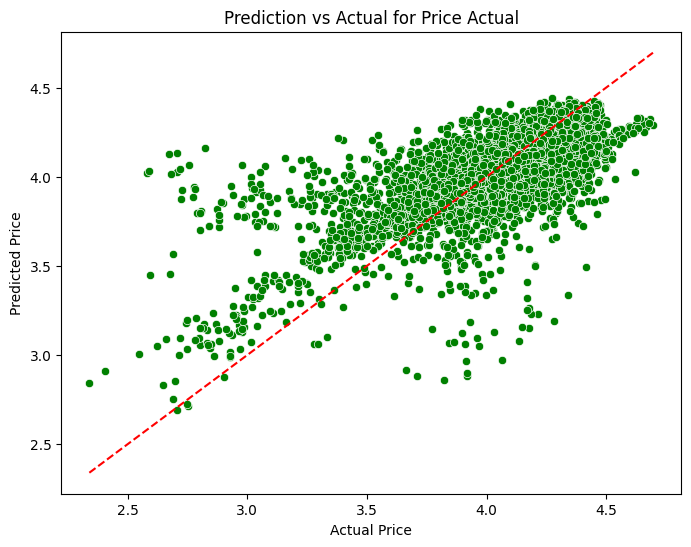

In [63]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, color='green')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.title('Prediction vs Actual for Price Actual')
plt.xlabel('Actual Price')
plt.ylabel('Predicted Price')
plt.show()

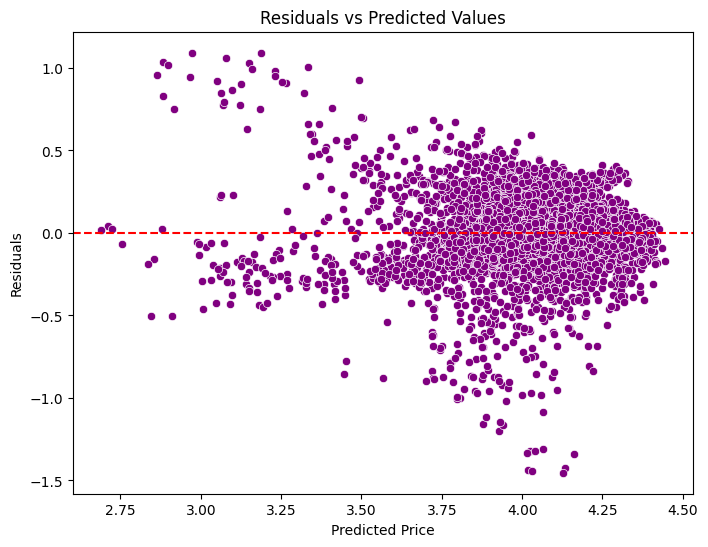

In [64]:
residuals = y_test - y_pred
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred, y=residuals, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.show()

In [65]:
categorical, non_categorical, discrete, continuous = classify_features(df2)

In [66]:
continuous

['generation biomass',
 'generation fossil brown coal/lignite',
 'generation fossil gas',
 'generation fossil hard coal',
 'generation fossil oil',
 'generation hydro pumped storage consumption',
 'generation hydro run-of-river and poundage',
 'generation hydro water reservoir',
 'generation nuclear',
 'generation other',
 'generation other renewable',
 'generation waste',
 'forecast solar day ahead',
 'total load forecast',
 'price day ahead',
 'price actual']

In [67]:
from sklearn.preprocessing import StandardScaler

In [68]:
features_to_scale = df2[continuous]

scaler = StandardScaler()

scaled_features = scaler.fit_transform(features_to_scale)

df_scaled = pd.DataFrame(scaled_features, columns=continuous)

df2[continuous] = df_scaled[continuous]

In [69]:
df2

,generation biomass,generation fossil brown coal/lignite,generation fossil coal-derived gas,generation fossil gas,generation fossil hard coal,generation fossil oil,generation fossil oil shale,generation fossil peat,generation geothermal,generation hydro pumped storage consumption,...,generation waste,generation wind offshore,forecast solar day ahead,total load forecast,price day ahead,price actual,year,month,day,hour
0,0.744015,-0.335877,0.0,-0.353773,0.288075,-2.596286,0.0,0.0,0.0,0.489302,...,-1.463738,0.0,-0.847639,-0.564673,0.015436,0.529854,2015,1,1,0
1,0.767453,-0.338698,0.0,-0.193863,0.254419,-2.672468,0.0,0.0,0.0,0.561250,...,-1.483665,0.0,-0.848235,-0.822399,-0.121375,0.495356,2015,1,1,1
2,0.755734,-0.352804,0.0,-0.347867,0.165692,-2.691514,0.0,0.0,0.0,0.869239,...,-1.463738,0.0,-0.853004,-1.131278,-0.174047,0.464379,2015,1,1,2
3,0.638541,-0.547459,0.0,-0.594547,-0.063774,-2.634377,0.0,0.0,0.0,1.297141,...,-1.563376,0.0,-0.856580,-1.321307,-0.520179,0.101098,2015,1,1,3
4,0.521349,-0.736472,0.0,-0.678137,-0.212163,-2.710559,0.0,0.0,0.0,1.704847,...,-1.603232,0.0,-0.852408,-1.507853,-0.784225,-0.129825,2015,1,1,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,-1.013875,-1.264017,0.0,0.913698,-0.830193,-2.291557,0.0,0.0,0.0,-0.598756,...,0.150412,0.0,-0.800550,0.415075,1.298041,1.347236,2018,12,31,19
35060,-1.025594,-1.264017,0.0,0.735162,-0.861808,-2.367739,0.0,0.0,0.0,-0.598756,...,0.210196,0.0,-0.827373,0.265533,1.267258,1.286689,2018,12,31,20
35061,-1.072471,-1.264017,0.0,0.637035,-0.935238,-2.482013,0.0,0.0,0.0,-0.536905,...,0.329762,0.0,-0.836314,-0.176126,1.163282,1.155739,2018,12,31,21
35062,-1.060752,-1.264017,0.0,0.426698,-1.001018,-2.577240,0.0,0.0,0.0,-0.463695,...,0.349690,0.0,-0.840486,-0.710079,0.961485,0.845260,2018,12,31,22


In [70]:
from sklearn.svm import SVR

In [71]:
features = df2.drop(columns=['price actual'])  
target = df2['price actual']

In [72]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

In [73]:
svr_model = SVR()
svr_model.fit(X_train, y_train)

SVR()

In [74]:
y_pred = svr_model.predict(X_test)

In [75]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Mean Squared Error: 0.90
R^2 Score: 0.10


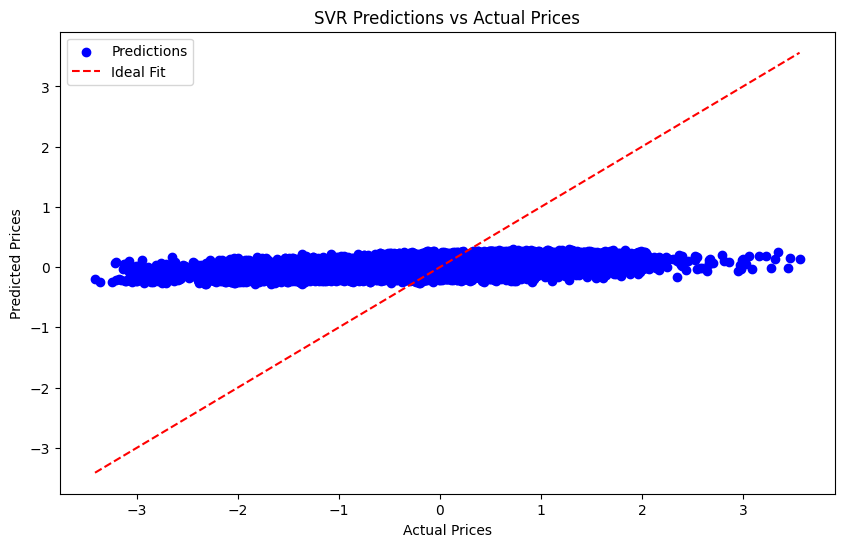

In [76]:
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue', label='Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('SVR Predictions vs Actual Prices')
plt.legend()
plt.show()

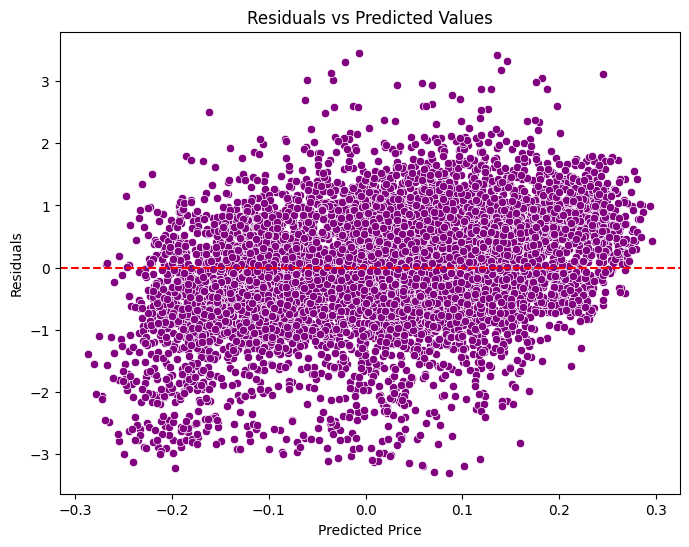

In [77]:
residuals = y_test - y_pred
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_pred, y=residuals, color='purple')
plt.axhline(0, color='red', linestyle='--')
plt.title('Residuals vs Predicted Values')
plt.xlabel('Predicted Price')
plt.ylabel('Residuals')
plt.show()

In [141]:
from sklearn.tree import DecisionTreeRegressor

In [ ]:
dt_model = DecisionTreeRegressor()
dt_model.fit(X_train, y_train)

In [ ]:
y_pred = dt_model.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R^2 Score: {r2:.2f}")

In [78]:
features = [
    'generation biomass', 'generation fossil brown coal/lignite',
    'generation fossil coal-derived gas', 'generation fossil gas',
    'generation fossil hard coal', 'generation fossil oil',
    'generation fossil oil shale', 'generation fossil peat',
    'generation geothermal', 'generation hydro pumped storage consumption',
    'generation hydro run-of-river and poundage',
    'generation hydro water reservoir', 'generation marine',
    'generation nuclear', 'generation other', 'generation other renewable',
    'generation waste', 'generation wind offshore',
    'forecast solar day ahead', 'total load forecast', 'price day ahead',
    'year', 'month', 'day', 'hour'
]
target = 'price actual'

In [79]:
X = df_new[features]
y = df_new[target]

In [80]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [82]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [83]:
model = Sequential([
    Dense(64, input_dim=X_train_scaled.shape[1], activation='relu'),
    Dense(32, activation='relu'),
    Dense(16, activation='relu'),
    Dense(1)  
])

In [84]:
model.compile(optimizer='adam', loss='mean_squared_error')

In [85]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 64)                1664      
                                                                 
 dense_1 (Dense)             (None, 32)                2080      
                                                                 
 dense_2 (Dense)             (None, 16)                528       
                                                                 
 dense_3 (Dense)             (None, 1)                 17        
                                                                 
Total params: 4289 (16.75 KB)
Trainable params: 4289 (16.75 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [86]:
history = model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

Epoch 1/50
702/702 [==============================] - 3s 3ms/step - loss: 558.6239 - val_loss: 81.5277
Epoch 2/50
702/702 [==============================] - 2s 3ms/step - loss: 69.8607 - val_loss: 65.3715
Epoch 3/50
702/702 [==============================] - 2s 3ms/step - loss: 59.7710 - val_loss: 58.9895
Epoch 4/50
702/702 [==============================] - 2s 2ms/step - loss: 53.7305 - val_loss: 53.5111
Epoch 5/50
702/702 [==============================] - 2s 3ms/step - loss: 48.5300 - val_loss: 48.3835
Epoch 6/50
702/702 [==============================] - 2s 3ms/step - loss: 42.9599 - val_loss: 44.1788
Epoch 7/50
702/702 [==============================] - 2s 3ms/step - loss: 38.7140 - val_loss: 39.2082
Epoch 8/50
702/702 [==============================] - 2s 3ms/step - loss: 35.3384 - val_loss: 36.3207
Epoch 9/50
702/702 [==============================] - 3s 4ms/step - loss: 33.2943 - val_loss: 34.0082
Epoch 10/50
702/702 [==============================] - 2s 3ms/step - loss: 31.422

In [87]:
y_pred = model.predict(X_test_scaled)

220/220 [==============================] - 0s 1ms/step


In [88]:
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse:.2f}")
print(f"R^2 Score: {r2:.2f}")

Mean Squared Error: 21.69
R^2 Score: 0.89


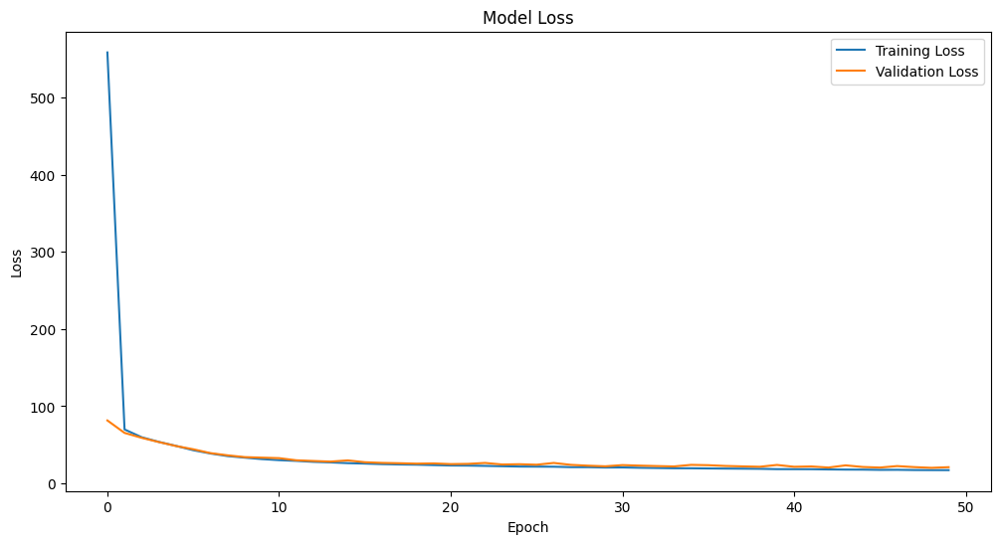

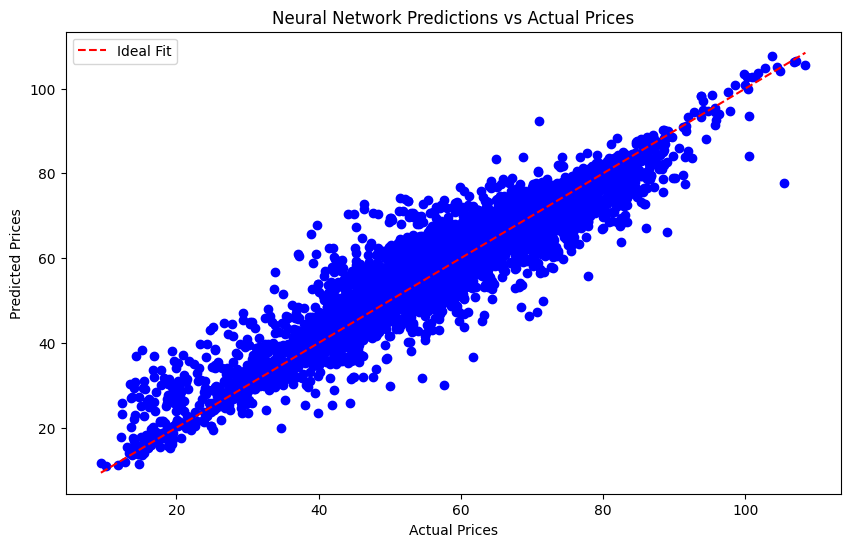

In [89]:
plt.figure(figsize=(12, 6))

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, color='blue')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Ideal Fit')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Neural Network Predictions vs Actual Prices')
plt.legend()
plt.show()

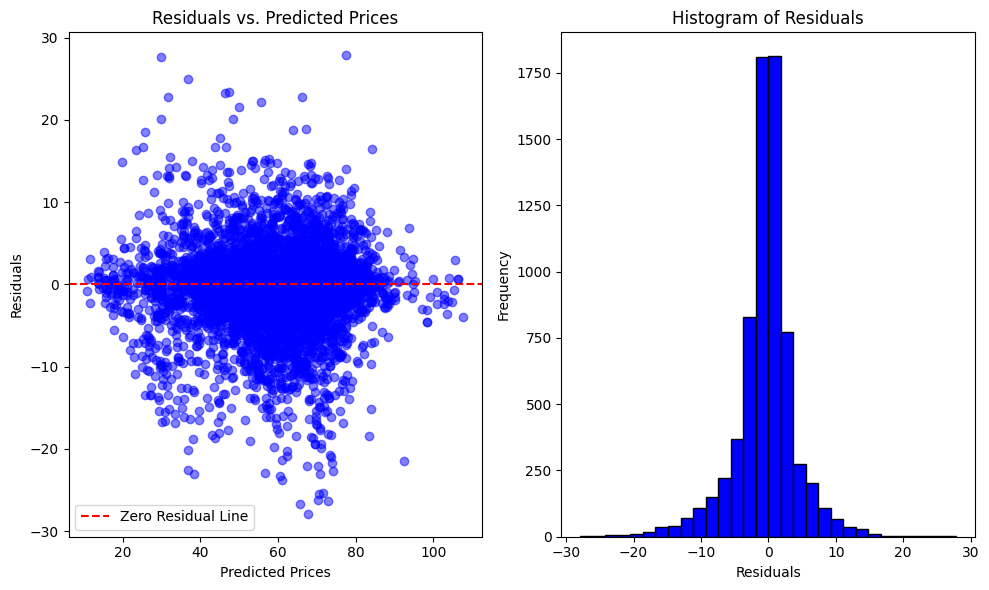

In [90]:
residuals = y_test - y_pred.flatten()  

plt.figure(figsize=(10, 6))

plt.subplot(1, 2, 1)
plt.scatter(y_pred, residuals, color='blue', alpha=0.5)
plt.axhline(y=0, color='red', linestyle='--', label='Zero Residual Line')
plt.xlabel('Predicted Prices')
plt.ylabel('Residuals')
plt.title('Residuals vs. Predicted Prices')
plt.legend()

plt.subplot(1, 2, 2)
plt.hist(residuals, bins=30, color='blue', edgecolor='black')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.title('Histogram of Residuals')

plt.tight_layout()
plt.show()

In [93]:
import re

In [98]:
from datetime import datetime

In [99]:
def extract_datetime(time_str):
    pattern = r'(\d{4}-\d{2}-\d{2} \d{2}:\d{2}:\d{2})'
    match = re.search(pattern, time_str)
    if match:
        datetime_str = match.group(1)
        return datetime.strptime(datetime_str, '%Y-%m-%d %H:%M:%S')
    else:
        return None

In [113]:
df3 = df_cleaned.copy()

In [114]:
df3['time'] = df_cleaned['time'].apply(extract_datetime)

In [115]:
df4 = df3[['time','price actual']]

In [116]:
df4

,time,price actual
0,2015-01-01 00:00:00,65.41
1,2015-01-01 01:00:00,64.92
2,2015-01-01 02:00:00,64.48
3,2015-01-01 03:00:00,59.32
4,2015-01-01 04:00:00,56.04
...,...,...
35059,2018-12-31 19:00:00,77.02
35060,2018-12-31 20:00:00,76.16
35061,2018-12-31 21:00:00,74.30
35062,2018-12-31 22:00:00,69.89


In [117]:
df4.set_index('time', inplace=True)

In [118]:
df4

,price actual
time,
2015-01-01 00:00:00,65.41
2015-01-01 01:00:00,64.92
2015-01-01 02:00:00,64.48
2015-01-01 03:00:00,59.32
2015-01-01 04:00:00,56.04
...,...
2018-12-31 19:00:00,77.02
2018-12-31 20:00:00,76.16
2018-12-31 21:00:00,74.30


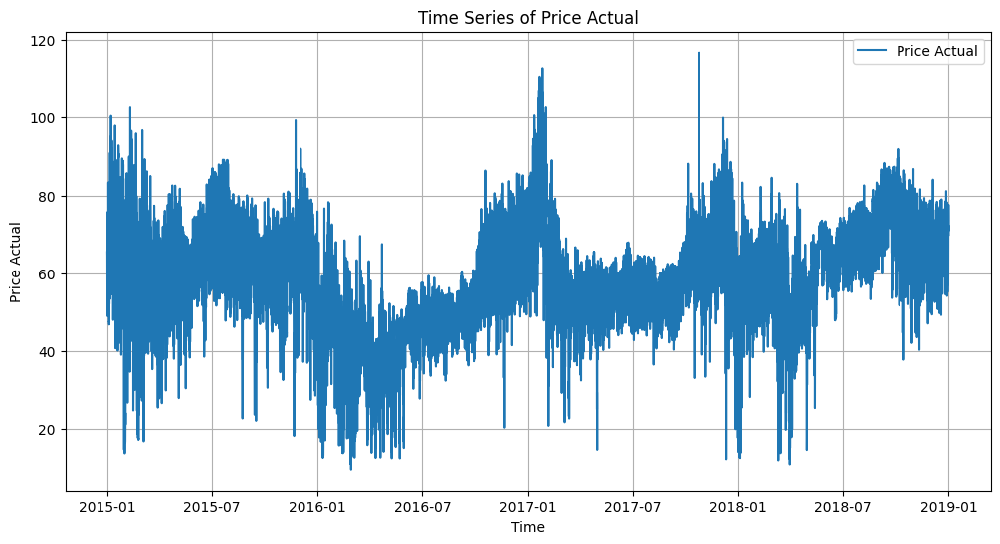

In [120]:
plt.figure(figsize=(12, 6))
plt.plot(df4.index, df4['price actual'], label='Price Actual')
plt.xlabel('Time')
plt.ylabel('Price Actual')
plt.title('Time Series of Price Actual')
plt.legend()
plt.grid(True)
plt.show()

In [123]:
duplicates = df4.index[df4.index.duplicated()]
print(f"Duplicate indices: {duplicates}")

Duplicate indices: DatetimeIndex(['2015-10-25 02:00:00', '2016-10-30 02:00:00',
               '2017-10-29 02:00:00', '2018-10-28 02:00:00'],
              dtype='datetime64[ns]', name='time', freq=None)


In [124]:
df4 = df4.loc[~df4.index.duplicated(keep='first')]

In [125]:
df4.index = pd.to_datetime(df4.index)
df4 = df4.asfreq('H')

In [127]:
missing_values = df4['price actual'].isnull().sum()
print(f"Missing values: {missing_values}")

Missing values: 4


In [128]:
df4['price actual'] = df4['price actual'].fillna(method='ffill')

### What is Time Series?

**Time series** refers to a sequence of data points measured at regular intervals over time. Each data point in a time series is indexed by time, and the goal of time series analysis is to study patterns, trends, and seasonal behavior, as well as make predictions about future data points based on historical data.

#### Characteristics of Time Series:
1. **Trend**: A long-term increase or decrease in the data.
2. **Seasonality**: Repeating short-term cycles over a fixed period (like daily, weekly, monthly patterns).
3. **Cyclic Behavior**: Similar to seasonality but without a fixed period; cycles vary in duration.
4. **Noise**: Random variation that doesn’t follow a trend or cycle.

Time series data is used across multiple domains like stock prices, sales data, weather forecasting, economic indicators, etc.

### What is `seasonal_decompose`?

`seasonal_decompose` is a function in `statsmodels` that is used to **decompose** (break down) a time series into its three main components:
- **Trend**: The long-term progression in the data.
- **Seasonality**: The repeating short-term pattern at a fixed interval (e.g., daily, monthly).
- **Residual**: The noise or random fluctuations left after trend and seasonality have been removed.

- **model**: You can specify `'additive'` or `'multiplicative'` based on whether the components combine additively or multiplicatively.
  - **Additive model**: Assumes that the data is a sum of the components: Data = Trend + Seasonality + Residuals)
  - **Multiplicative model**: Assumes that the data is a product of the components: Data = Trend * Seasonality * Residuals)
  
- **period**: Defines the number of observations per cycle (e.g., 12 for monthly data with annual seasonality, 24 for hourly data with daily seasonality).

#### Decomposition Components:
1. **Trend**: Shows the overall upward or downward movement in the data.
2. **Seasonality**: Extracts the periodic (seasonal) behavior.
3. **Residuals**: The part of the data that remains after removing the trend and seasonality.

### Why Use `seasonal_decompose`?

- **Understanding Components**: It helps to separate trend and seasonality, making it easier to understand the underlying patterns.
- **Prediction and Forecasting**: By removing the seasonal and trend components, we can make more accurate predictions using models like ARIMA.
- **Anomaly Detection**: Residuals can help identify anomalies or outliers in the time series data.


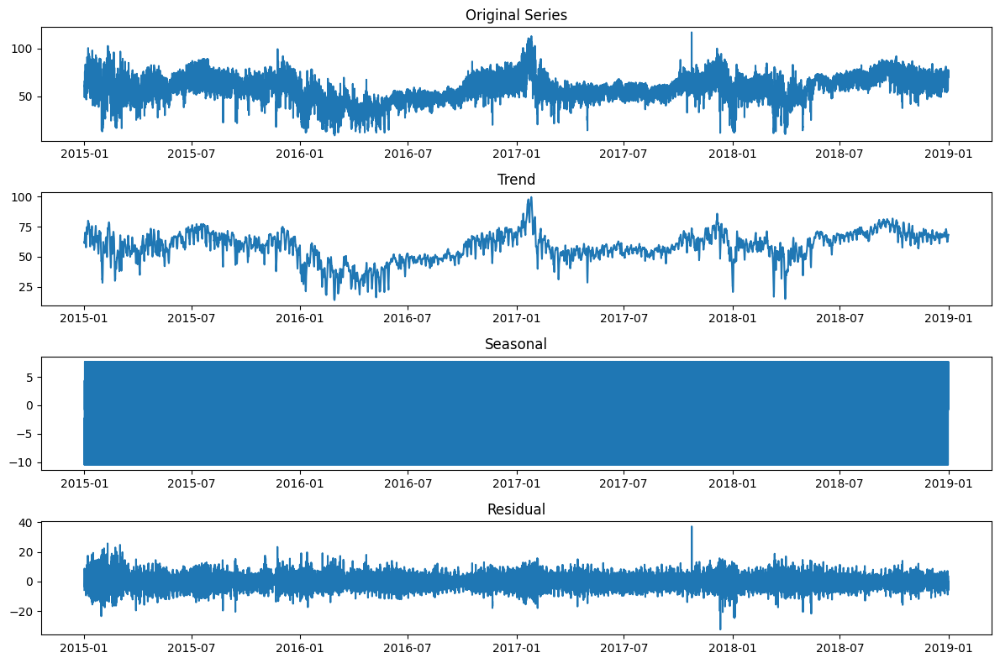

In [129]:
from statsmodels.tsa.seasonal import seasonal_decompose

decomposition = seasonal_decompose(df4['price actual'], model='additive')

plt.figure(figsize=(12, 8))

plt.subplot(4, 1, 1)
plt.plot(df4.index, df4['price actual'], label='Original')
plt.title('Original Series')

plt.subplot(4, 1, 2)
plt.plot(decomposition.trend, label='Trend')
plt.title('Trend')

plt.subplot(4, 1, 3)
plt.plot(decomposition.seasonal, label='Seasonal')
plt.title('Seasonal')

plt.subplot(4, 1, 4)
plt.plot(decomposition.resid, label='Residual')
plt.title('Residual')

plt.tight_layout()
plt.show()

Here’s a plain text explanation of the two topics:

### 1. ARIMA Model (`from statsmodels.tsa.arima.model import ARIMA`)

**ARIMA** (AutoRegressive Integrated Moving Average) is a model used for analyzing and forecasting time series data. It's commonly used because it can capture trends, seasonality, and relationships in data over time.

#### Components of ARIMA:
ARIMA consists of three parts:
- **AR (AutoRegressive)**: This component uses past values to predict future ones. If the AR part is 2 (`p=2`), it means the model looks at the two previous values to make a prediction.

- **I (Integrated)**: This is where differencing comes into play. Differencing means subtracting the previous value from the current value. It's used to make the time series stationary (removing trends). If differencing is applied once (`d=1`), it removes linear trends. If done twice (`d=2`), it removes quadratic trends.

- **MA (Moving Average)**: This part uses past errors in the prediction to adjust the model. For example, if the MA part is 3 (`q=3`), it means the model adjusts using the past three errors.

Together, ARIMA is represented by three numbers `(p, d, q)`:
- **p**: The number of past values (lag) the model uses.
- **d**: How many times the data is differenced to remove trends.
- **q**: The number of past error terms the model uses.

#### How ARIMA Works:
- **Fitting ARIMA**: It first makes the data stationary using differencing (if necessary), then fits an AR and MA model to the stationary data. It uses past values and past errors to make predictions.

- **Why Use ARIMA**: It can handle both stationary and non-stationary data, and it models both trends (with the AR part) and error patterns (with the MA part), making it useful for real-world forecasting tasks like sales or stock prices.

---

### 2. Autocorrelation Plot (`from pandas.plotting import autocorrelation_plot`)

An **autocorrelation plot** helps visualize the relationship between an observation in a time series and its previous values (lags). This is useful to identify patterns like trends, seasonality, or cycles in time series data.

#### What is Autocorrelation?
- **Autocorrelation** shows how much today's value depends on previous values. For example, autocorrelation at lag 1 shows how much today’s value is related to yesterday’s value, lag 2 shows the relation to the value from two days ago, and so on.

- **Positive Autocorrelation**: If today’s value increases, tomorrow’s value also tends to increase.

- **Negative Autocorrelation**: If today’s value increases, tomorrow’s value tends to decrease.

#### Purpose of an Autocorrelation Plot:
- **Identifying Lag Values (AR terms)**: The plot helps you decide how many previous values (lags) to include in your ARIMA model. If there are significant values at lag 1, 2, or 3, this means those previous values influence the current value, suggesting a higher AR term (`p`).

- **Check Stationarity**: If the autocorrelation drops to zero quickly, it indicates the series is likely stationary. If autocorrelation stays high, it suggests the data is not stationary, and differencing is needed (`d` in ARIMA).

- **Understanding Seasonality**: If the plot shows repeating patterns, it means there is seasonality, and you might need to adjust the model to handle this.

#### How to Interpret the Autocorrelation Plot:
- **Significant Lag**: A lag is significant if it falls outside the confidence interval (usually shown by dashed lines). This means that the value at that lag is correlated with the current value and should be considered in the ARIMA model.

- **Slow Decay**: If the autocorrelation decreases slowly, it suggests the presence of a trend, which means the data is non-stationary and differencing is needed.

- **Spike at Lag 1 or 2**: If there is a spike at lag 1 or 2 and not much beyond, it suggests that the model may need a low AR or MA term.

### Summary:
1. **ARIMA**: A flexible model for time series forecasting that accounts for both trends and patterns in the data through autoregression, differencing, and moving averages.
  
2. **Autocorrelation Plot**: A tool to check how much today's value is influenced by past values, helping to decide how many lag terms (AR) to use and whether the data is stationary.

In [130]:
from statsmodels.tsa.arima.model import ARIMA
from pandas.plotting import autocorrelation_plot

### Rolling Mean and Rolling Standard Deviation

**Rolling Mean:**
- The rolling mean (or moving average) calculates the average of the data points within a fixed-size window that moves across the data series.
- **Purpose**: It helps smooth out short-term fluctuations and highlights longer-term trends or cycles in the time series data.
- **How It Works**: For each point in the series, the rolling mean computes the average of the current and previous `window` number of points. As the window moves forward, the mean is updated based on the new set of points.

**Rolling Standard Deviation:**
- The rolling standard deviation measures the variability or dispersion of data points within the fixed-size window.
- **Purpose**: It provides insight into the consistency or volatility of the data within the window. A higher standard deviation indicates more variability.
- **How It Works**: For each point in the series, the rolling standard deviation calculates how much the data points within the window deviate from their mean. As the window moves, the standard deviation is updated based on the new data points.

### Interpretation

- **Rolling Mean**: A line plot of the rolling mean over time will show how the average price changes. It smooths out short-term fluctuations and helps you observe trends.
- **Rolling Standard Deviation**: A line plot of the rolling standard deviation will show how the variability of prices changes over time. Periods with high variability will have higher standard deviations.

**Use Cases:**
- **Trend Analysis**: The rolling mean helps identify the underlying trend in the time series data by smoothing out short-term noise.
- **Volatility Analysis**: The rolling standard deviation helps identify periods of high or low volatility. For example, in financial time series, higher rolling standard deviation might indicate more volatile periods.

Both metrics are valuable for understanding the behavior of time series data, especially when analyzing trends and fluctuations over time.

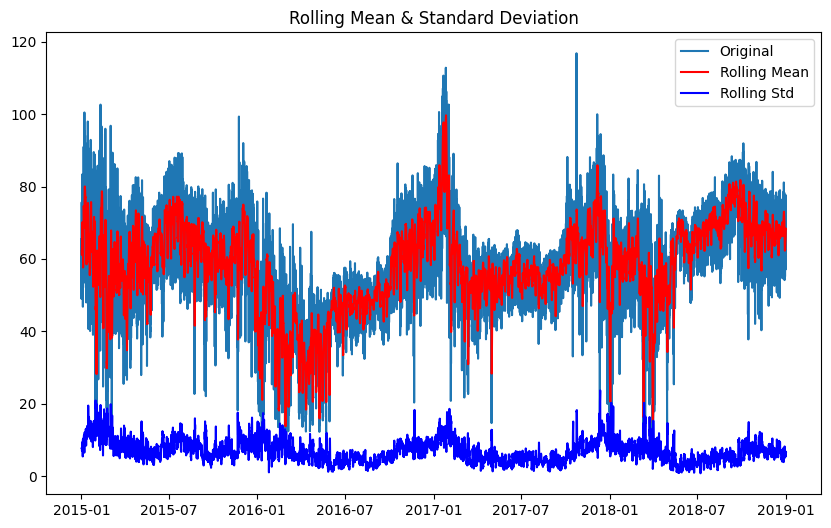

In [131]:
rolling_mean = df4['price actual'].rolling(window=24).mean()
rolling_std = df4['price actual'].rolling(window=24).std()

plt.figure(figsize=(10,6))
plt.plot(df4['price actual'], label='Original')
plt.plot(rolling_mean, color='red', label='Rolling Mean')
plt.plot(rolling_std, color='blue', label='Rolling Std')
plt.legend(loc='best')
plt.title('Rolling Mean & Standard Deviation')
plt.show()

In [132]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(df4['price actual'])
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

ADF Statistic: -9.144092284741765
p-value: 2.7982214411482104e-15


The `adfuller` function from the `statsmodels.tsa.stattools` module is used to perform the Augmented Dickey-Fuller (ADF) test, which is a statistical test used to determine if a time series is stationary.

### Augmented Dickey-Fuller (ADF) Test

**Purpose:**
- The ADF test is used to test the null hypothesis that a time series has a unit root, meaning it is non-stationary. 
- Non-stationary data often exhibits trends or seasonality, while stationary data has constant statistical properties over time.

**Key Concepts:**

1. **Stationarity:**
   - A stationary time series has statistical properties such as mean, variance, and autocorrelation that do not change over time.
   - Stationary data is often easier to model and predict because its behavior is more consistent.

2. **Unit Root:**
   - The presence of a unit root indicates that the time series is non-stationary and likely has a trend or other time-dependent structure.

**Test Components:**

- **ADF Statistic:** 
  - This value represents the test statistic from the ADF test. It measures how strongly the time series is stationary. 
  - A more negative ADF statistic suggests stronger evidence against the null hypothesis (i.e., the time series is more likely to be stationary).

- **p-value:** 
  - This value indicates the probability of observing the test statistic under the null hypothesis. 
  - A lower p-value (typically less than 0.05) suggests that the null hypothesis of a unit root can be rejected, implying that the time series is likely stationary.

**Interpreting the Results:**

- **ADF Statistic Value:**
  - If the ADF statistic is significantly negative, it provides evidence that the time series is stationary. 
  - Conversely, a value close to zero may indicate that the series is not stationary.

- **p-value:**
  - A small p-value (typically < 0.05) indicates that you can reject the null hypothesis and conclude that the time series is likely stationary.
  - A larger p-value suggests that the null hypothesis cannot be rejected, meaning the time series may still have a unit root and could be non-stationary.

In summary, the ADF test is a crucial step in time series analysis to check for stationarity, which is important for many time series forecasting models and methods.

In [133]:
p = 5  
d = 0  
q = 5  

model = ARIMA(df4['price actual'], order=(p, d, q))
model_fit = model.fit()

d:\pythonnn\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [134]:
print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:           price actual   No. Observations:                35064
Model:                 ARIMA(5, 0, 5)   Log Likelihood              -85934.979
Date:                Wed, 18 Sep 2024   AIC                         171893.958
Time:                        17:34:05   BIC                         171995.537
Sample:                    01-01-2015   HQIC                        171926.311
                         - 12-31-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         57.8842      1.026     56.440      0.000      55.874      59.894
ar.L1          1.3053      0.002    801.401      0.000       1.302       1.309
ar.L2          0.1123      0.002     68.898      0.0

In [135]:
df5 = df4.copy()

In [136]:
df5['forecast'] = model_fit.predict(start=0, end=len(df5)-1)

In [137]:
df5

,price actual,forecast
time,,
2015-01-01 00:00:00,65.41,57.884239
2015-01-01 01:00:00,64.92,65.281677
2015-01-01 02:00:00,64.48,64.544244
2015-01-01 03:00:00,59.32,64.177439
2015-01-01 04:00:00,56.04,56.999832
...,...,...
2018-12-31 19:00:00,77.02,78.729044
2018-12-31 20:00:00,76.16,77.664931
2018-12-31 21:00:00,74.30,76.226241


In [138]:
forecast_steps = 24
forecast = model_fit.forecast(steps=forecast_steps)

forecast_index = pd.date_range(df5.index[-1], periods=forecast_steps + 1, freq='H')[1:]

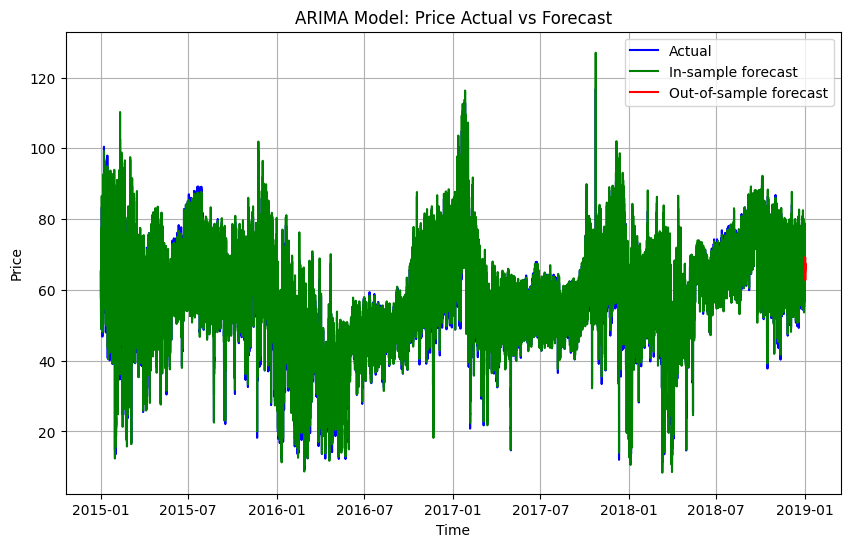

In [140]:
plt.figure(figsize=(10, 6))

plt.plot(df5.index, df5['price actual'], label='Actual', color='blue')

plt.plot(df5.index, df5['forecast'], label='In-sample forecast', color='green')

plt.plot(forecast_index, forecast, label='Out-of-sample forecast', color='red')

plt.title('ARIMA Model: Price Actual vs Forecast')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.grid(True)
plt.show()

# Thanks !!!